## Table of Contents:
* [1. Calculate per-TF Zscore](#first-bullet)
    - requires all *metric.csv
* [2. Do z-scores change by downsampling catgory?](#second-bullet)
* [3. Do z-scores change by cell line?](#third-bullet)
* [4. Common traits among top TFs](#fourth-bullet)
    - Fig
* [5. How do z-scores change by tool?](#fifth-bullet)
* [6. Can mean F1 serve as baseline to find cell-type specific TFs?](#sixth-bullet)
    * [6.1 distribution plots](#sixth1-bullet)
    * [6.2 upset plots](#sixth2-bullet)
    * [6.3 scatter plots](#sixth3-bullet)
    * [6.4 heatmaps](#sixth4-bullet)
* [7. Are the trends observable in the baseline samples?](#seventh-bullet)

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pybedtools, os, re, pickle
import pandas as pd
import numpy as np

from matplotlib.gridspec import GridSpec
import matplotlib.gridspec as gridspec

from matplotlib import pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import matplotlib
import matplotlib.lines as lines
from scipy.cluster import hierarchy
from matplotlib.lines import Line2D   
import itertools

from upsetplot import UpSet
from upsetplot import from_contents

from scipy.stats import zscore

sns.set(style='whitegrid', rc={"figure.dpi":300, 'savefig.dpi':300})  
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.family'] = ['Arial', 'sans-serif']

color_scheme_cl = {"GM12878": "#267A9E", "MCF7": "#51A885", "K562":"#F5A936", "SKNSH": "#DB7476", "HEPG2": "#986B9B"}
color_scheme_prog = {"tobias":"#008080", "hint":"#CC5500", "print": "#A4254E"}
color_scheme_st = {"peakreads":"green", "cells":"#CE3B59", "frip":"#F5C23C", "reads":"#993CBE", "baseline":"black"}


<a id="first-bullet"></a>
# 1. Calculate per-TF Zscore

In [4]:
def _getzscores(data_dir, metric, cl):
    from scipy.stats import zscore
    
    files = [x for x in os.listdir(data_dir) if x.endswith("_metrics.csv") and cl in x]
    files.remove(f"{cl}_metrics.csv")

    p_dict = {}
    for f in files:
        df = pd.read_csv(f"{data_dir}/{f}", index_col=0)
        df = df.loc[df["type"] == "tf"]
        df = df.sort_index(ascending=True)
        tmp = df[[metric]].apply(zscore)
        p_dict[re.sub("_metrics.csv", '', f) ] = tmp[metric].values

    p_dict["TF"] = df.index
    
    zscore_df = pd.DataFrame.from_dict(p_dict)
    zscore_df.index = zscore_df.TF
    
    zscore_df_long = pd.melt(zscore_df, id_vars=['TF'], var_name='file', value_name='zscore')
    zscore_df_long[["cell_line", "tmp", "seed"]] = zscore_df_long.file.str.split('_', expand=True)
    zscore_df_long["group"] = [s[:1] for s in zscore_df_long["tmp"]]
    zscore_df_long["condition"] = [s[1:] for s in zscore_df_long["tmp"]]
    
    zscore_df_long.loc[zscore_df_long.group == "f", "condition"] = [f"0.{i[1:]}" for i in zscore_df_long.loc[zscore_df_long.group == "f"]["condition"]]
    zscore_df_long["condition"] = pd.to_numeric(zscore_df_long["condition"], errors='coerce')

    zscore_df_long = zscore_df_long[zscore_df_long.group !="p"]
    return(zscore_df_long)


zscore_dict={}
for prog in ["hint", "tobias", "print"]:
    if prog == "hint":
        data_dir = f"../../06_dataquality/{prog}/metrics/no_threshold/"
    elif prog == "tobias":
        data_dir = f"../../06_dataquality/{prog}/metrics/bound_threshold/"
    elif prog == "print":
        data_dir = f"../../06_dataquality/{prog}/metrics/thresh_03/"

    res_df = pd.DataFrame() 
    for cl in ["HEPG2", "K562", "MCF7", "SKNSH", "GM12878"]:
        df = _getzscores(data_dir, "f1", cl)
        df_mean = df.groupby(["group", "TF", "cell_line"])["zscore"].agg(['mean', 'std']).reset_index()
        res_df = pd.concat([res_df, df_mean])

    zscore_dict[prog] = res_df

print("done")

done


<a id="second-bullet"></a>
# 2. Do Z-scores change by downsampling catgory?

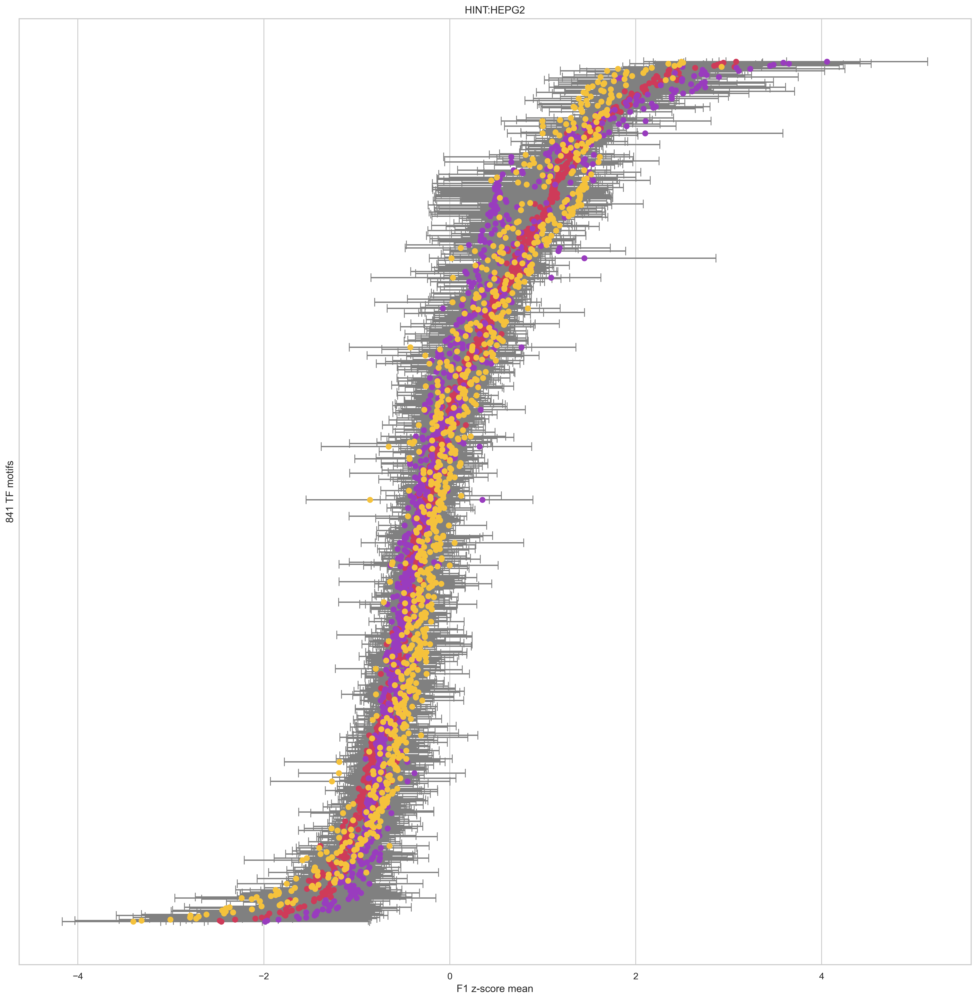

In [5]:
#get mean
df_mean = df.groupby(["group", "TF"])["zscore"].agg(['mean', 'std']).reset_index()

#get sorting order
grouped_means = df_mean.groupby("TF")["mean"].mean()
tf_order = grouped_means.sort_values().index

df_mean['TF'] = pd.Categorical(df_mean['TF'], categories=tf_order, ordered=True)
df_mean = df_mean.sort_values(by='TF', ascending=True)


sns.set(style='whitegrid')
fig = plt.figure(figsize=(20,20))
gs = GridSpec(1,1, figure=fig, wspace=0.25)

ax = fig.add_subplot(gs[0])

tmp = df_mean[df_mean.group == "c"]

y_positions = range(len(tmp))
ax.errorbar(
    tmp["mean"], 
    y_positions, 
    xerr=tmp["std"], 
    fmt='o', ecolor='grey', capsize=5, label='Mean ± Std', color=color_scheme_st["cells"]
)

tmp = df_mean[df_mean.group == "r"]
ax.errorbar(
    tmp["mean"], 
    y_positions, 
    xerr=tmp["std"], 
    fmt='o', ecolor='grey', capsize=5, label='Mean ± Std', color=color_scheme_st["reads"]
)

tmp = df_mean[df_mean.group == "f"]
ax.errorbar(
    tmp["mean"], 
    y_positions, 
    xerr=tmp["std"], 
    fmt='o', ecolor='grey', capsize=5, label='Mean ± Std', color=color_scheme_st["frip"]
)
ax.set_yticks(y_positions)
ax.set_yticklabels(tmp['TF'])

ax.set_xlabel('F1 z-score mean')
plt.yticks([])
ax.set_ylabel("841 TF motifs")
ax.set_title("HINT:HEPG2")
plt.show()

# 3. Do z-scores change by cell line?

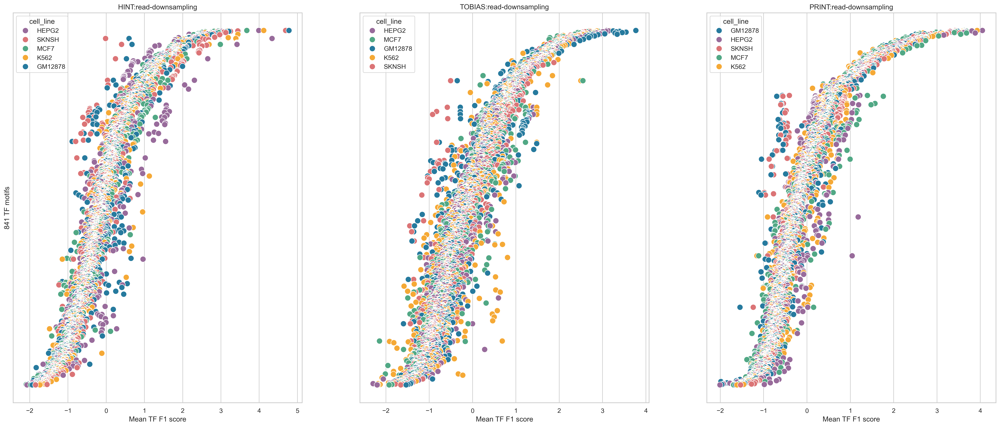

In [6]:
def _tfreorder(res_df, col="mean"):
    res_df['TF'] = res_df.TF.astype(str) #override any categories in place bc pandas is a bitch
    grouped_means = res_df.groupby("TF", observed=True)[col].mean()
    tf_order = grouped_means.sort_values().index
    res_df["TF"] = pd.Categorical(res_df["TF"], categories=tf_order, ordered=True)
    res_df = res_df.sort_values(by='TF', ascending=False)
    return res_df


sns.set(style='whitegrid')
fig = plt.figure(figsize=(30,12))
gs = GridSpec(1,3, figure=fig)

ax = fig.add_subplot(gs[0])
res_df = zscore_dict["hint"]
tmp = _tfreorder(res_df[res_df.group =="r"].copy())
sns.scatterplot(data=tmp, 
                x='mean', 
                y='TF', hue="cell_line", palette=color_scheme_cl, s=100)
ax.set_xlabel('Mean TF F1 score')
ax.invert_yaxis()
plt.yticks([])
ax.set_ylabel("841 TF motifs")
ax.set_title("HINT:read-downsampling")


ax = fig.add_subplot(gs[1])
res_df = zscore_dict["tobias"]
tmp = _tfreorder(res_df[res_df.group =="r"].copy())
sns.scatterplot(data=tmp, 
                x='mean', 
                y='TF', hue="cell_line", palette=color_scheme_cl, s=100)
ax.invert_yaxis()
plt.yticks([]); ax.set_ylabel("")
ax.set_xlabel('Mean TF F1 score')
ax.set_title("TOBIAS:read-downsampling")

ax = fig.add_subplot(gs[2])
res_df = zscore_dict["print"]
tmp = _tfreorder(res_df[res_df.group =="r"].copy())
sns.scatterplot(data=tmp, 
                x='mean', 
                y='TF', hue="cell_line", palette=color_scheme_cl, s=100)
ax.invert_yaxis()
plt.yticks([]); ax.set_ylabel("")
ax.set_xlabel('Mean TF F1 score')
ax.set_title("PRINT:read-downsampling")


plt.show()


In [7]:
mean_zscore_df = pd.DataFrame() 
for prog in ["hint","tobias","print"]:
    for st in ["r", "c", "f"]:
        res_df = zscore_dict[prog]
        res_df = res_df[res_df.group ==st].copy()
        tmp = res_df.groupby("TF", observed=True)["mean"].agg(['mean', 'var', 'std']).reset_index()
        tmp["prog"] = prog
        tmp["sampling_type"] = st
        mean_zscore_df = pd.concat([mean_zscore_df, tmp])

mean_zscore_df['prog'] = mean_zscore_df['prog'].astype('category')
display(mean_zscore_df)

,TF,mean,var,std,prog,sampling_type
0,AHR::ARNT_MA0006.1,1.289819,0.015333,0.123827,hint,r
1,ALX1_MA0854.1,-1.520227,0.033213,0.182244,hint,r
2,ALX3_MA0634.1,-0.538145,0.027008,0.164343,hint,r
3,ALX4_MA0853.1,-1.587609,0.024889,0.157762,hint,r
4,ARGFX_MA1463.1,-0.701865,0.024540,0.156651,hint,r
...,...,...,...,...,...,...
836,ZNF8_MA1718.1,-1.207523,0.063473,0.251939,print,f
837,ZNF93_MA1721.1,1.582143,0.012454,0.111596,print,f
838,ZSCAN29_MA1602.1,-0.196733,0.026693,0.163379,print,f
839,ZSCAN31_MA1722.1,-0.020920,0.032457,0.180159,print,f


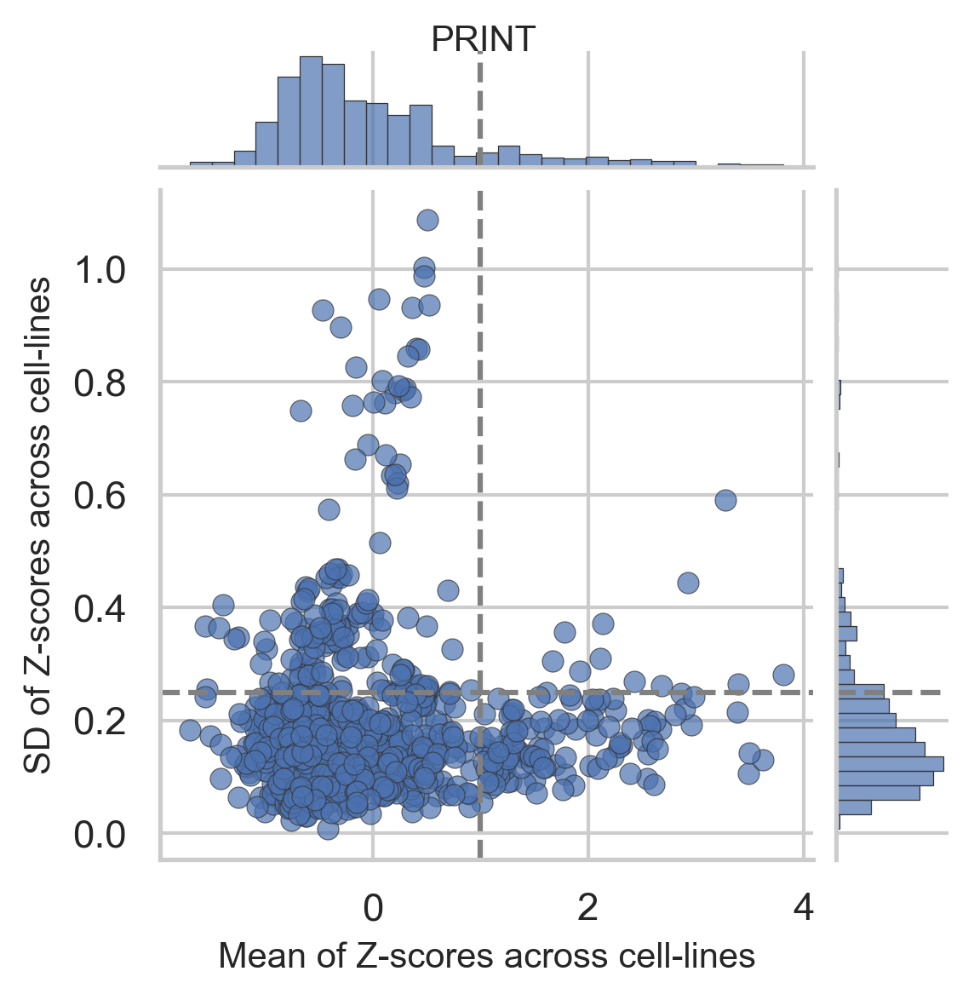

In [10]:
tmp = mean_zscore_df[(mean_zscore_df["prog"] == "print") & (mean_zscore_df["sampling_type"] == "r")]
g = sns.JointGrid(data=tmp,  x='mean',  y='std', height=4)
g.plot(sns.scatterplot, sns.histplot, alpha=.7, edgecolor=".2", linewidth=.3)
g.refline(x=1, y=0.25)
g.fig.suptitle("PRINT", fontsize=10)
g.set_axis_labels("Mean of Z-scores across cell-lines", "SD of Z-scores across cell-lines", fontsize=10)
plt.show()

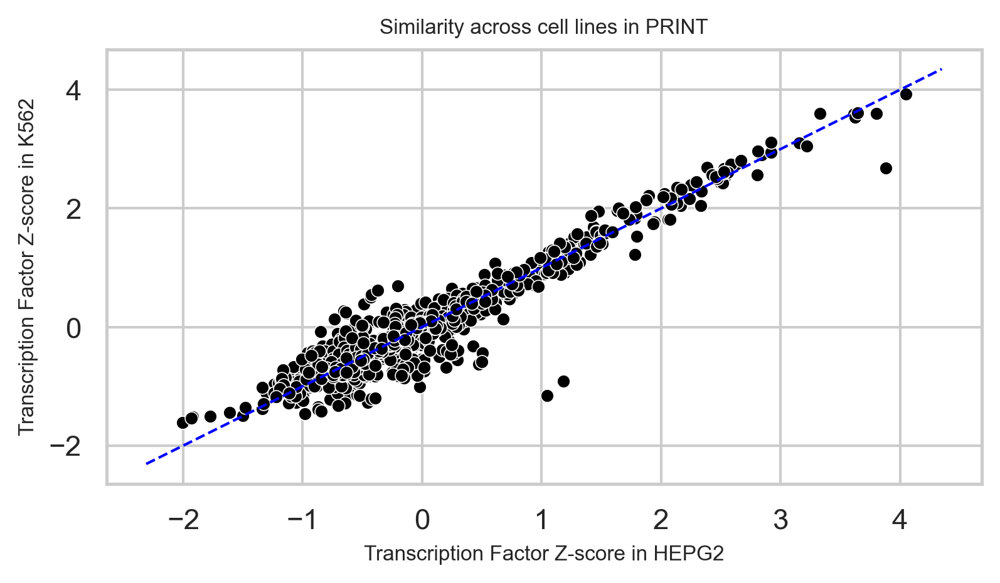

In [11]:
tmp = zscore_dict["print"]
tmp = tmp[(tmp.group == "r")]
tmp = tmp[["TF", "mean","cell_line"]].pivot(index='TF',columns='cell_line').reset_index()
tmp.columns = tmp.columns.map('_'.join)

sns.set(style='whitegrid')
fig = plt.figure(figsize=(6,3))
gs = GridSpec(1,1, figure=fig, wspace=0.25)

ax = fig.add_subplot(gs[0])
sns.scatterplot(data=tmp, 
                x="mean_HEPG2",
                y='mean_K562', ax=ax, color="black", s=25)

axes = plt.gca()
x_min, x_max = axes.get_xlim()
y_min, y_max = axes.get_ylim()
plt.plot([min(x_min, y_min), max(x_max, y_max)], [min(x_min, y_min), max(x_max, y_max)], 
         color='blue', linestyle="dashed", linewidth=1)

ax.set_xlabel("Transcription Factor Z-score in HEPG2", fontsize=8)
ax.set_ylabel("Transcription Factor Z-score in K562", fontsize=8)
ax.set_title("Similarity across cell lines in PRINT", fontsize=8)

plt.show()


# 4. Common traits among top TFs

In [12]:
#make df with all the info of interest. 

#IC/GC content
pwm_metrics = pd.read_csv("../09_simPWMs/00_constructing_PWMs/jaspar2022_ICcontent.csv")
pwm_metrics[["base1", "base2"]] = pwm_metrics.TF.str.split('_', expand=True)

#USFs
usf = pd.read_csv("../05_footprinting/program_input_files/USF_list.csv", header=None)
usfs = usf[0].tolist()
pwm_metrics["USF"] = 0
pwm_metrics.loc[pwm_metrics.base1.isin(usfs), "USF"] = 1

#JASPAR CLUSTER
jaspar_clusters = pd.read_table("../05_footprinting/program_input_files/jaspar2022_motifs_to_clusters.txt", sep=" ", header=None, names=["motif","cluster"])
jaspar_clusters.columns = ["TF", "jaspar_cluster"]
pwm_metrics = pwm_metrics.merge(jaspar_clusters, on="TF", how="left")

#DNA BINDING DOMAIN
jaspar_dbd = pd.read_table("../05_footprinting/program_input_files/jaspar2022_dndbd.csv", sep=",", 
                               header=None, names=["motif_id", "tf", "tf1_class","tf2_class","tf1_family", "tf2_family"])
columns_to_convert = {"motif_id":str, "tf":str, "tf1_class":str,"tf1_family":str,"tf2_class":str, "tf2_family":str}
jaspar_dbd = jaspar_dbd.astype(columns_to_convert)
jaspar_dbd["tf"] = [x.upper() for x in jaspar_dbd["tf"].values] 
jaspar_dbd["TF"] = jaspar_dbd["tf"] + '_' + jaspar_dbd["motif_id"]
pwm_metrics = pwm_metrics.merge(jaspar_dbd, on="TF")

pwm_metrics.drop(["base1", "base2"], inplace=True, axis=1)
print(pwm_metrics.shape)
display(pwm_metrics)

FileNotFoundError: [Errno 2] No such file or directory: '../09_simPWMs/00_constructing_PWMs/jaspar2022_ICcontent.csv'

In [715]:
print(mean_zscore_df.shape)
mean_zscore_df_info = mean_zscore_df.merge(pwm_metrics, on="TF")
print(mean_zscore_df_info.shape)

(7569, 6)
(7578, 24)


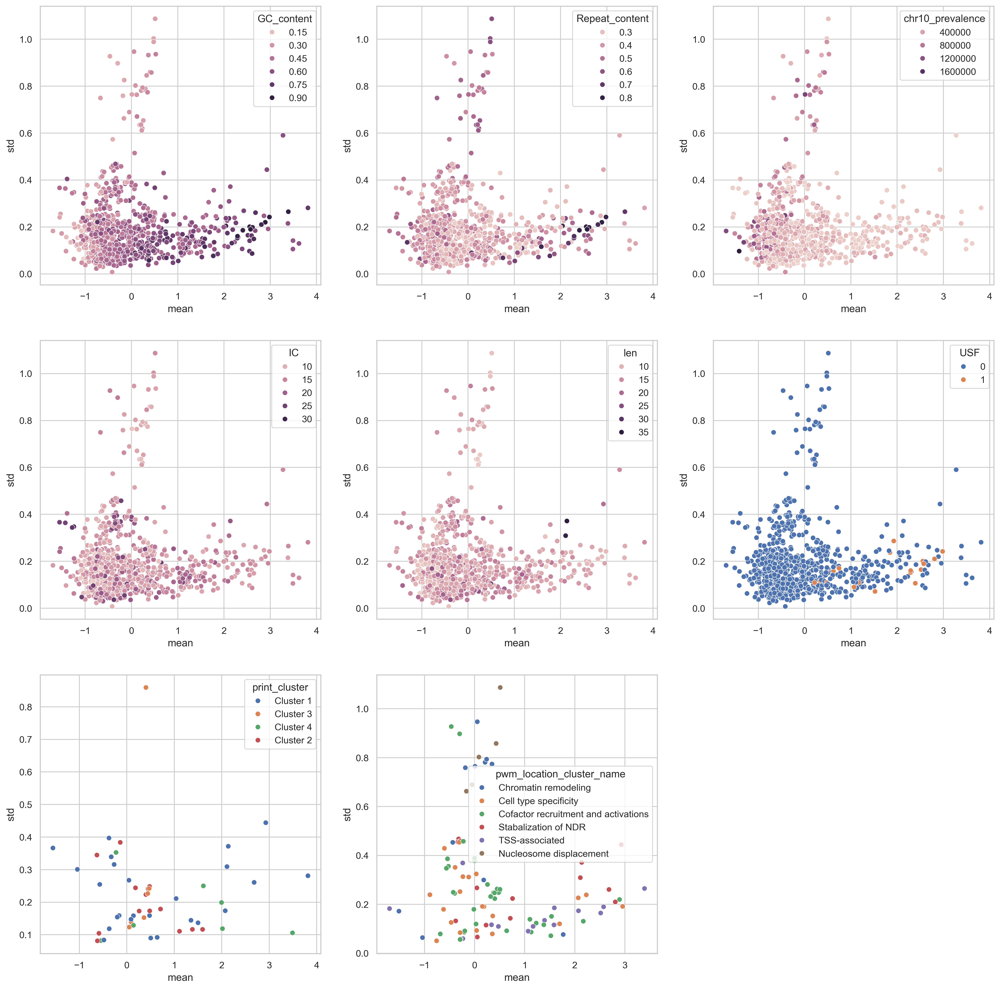

In [716]:
### FOR PRINT specifically 
tmp2 = mean_zscore_df_info[(mean_zscore_df_info["prog"] == "print") & (mean_zscore_df_info["sampling_type"] == "r")]

sns.set(style='whitegrid')
fig = plt.figure(figsize=(20,20))
gs = GridSpec(3,3, figure=fig)

ax = fig.add_subplot(gs[0])
sns.scatterplot(data=tmp2, x='mean', y='std', hue="GC_content")

ax = fig.add_subplot(gs[1])
sns.scatterplot(data=tmp2, x='mean', y='std', hue="Repeat_content")

ax = fig.add_subplot(gs[2])
sns.scatterplot(data=tmp2, x='mean', y='std', hue="chr10_prevalence")

ax = fig.add_subplot(gs[3])
sns.scatterplot(data=tmp2, x='mean', y='std', hue="IC")

ax = fig.add_subplot(gs[4])
sns.scatterplot(data=tmp2, x='mean', y='std', hue="len")

ax = fig.add_subplot(gs[5])
sns.scatterplot(data=tmp2, x='mean', y='std', hue="USF")

ax = fig.add_subplot(gs[6])
sns.scatterplot(data=tmp2, x='mean', y='std', hue="print_cluster")

ax = fig.add_subplot(gs[7])
sns.scatterplot(data=tmp2, x='mean', y='std', hue="pwm_location_cluster_name")


plt.show()

### All general PWM metrics

In [717]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from scipy.stats import pearsonr, pointbiserialr

results = []
allmetrics = ["GC_content", "Repeat_content", "IC", "len", "USF", "chr10_prevalence"]

for i, tool in enumerate(["hint", "tobias", "print"]):
    subset = mean_zscore_df_info[(mean_zscore_df_info["prog"] == tool) & (mean_zscore_df_info["sampling_type"] == "r")]
    for val in allmetrics:
        X = subset[[val]].values.flatten()
        Y = subset[['mean']].values.flatten()
        if val == 'USF': corr, p_value = pointbiserialr(X, Y)
        else: corr, p_value = pearsonr(X,Y)
        
        results.append([tool, val, corr, p_value])
    
# Show results
df_results = pd.DataFrame(results, columns=['Tool', 'Metric', "R", "pval"])
display(df_results.sort_values("R", ascending=False)[:15])

,Tool,Metric,R,pval
6,tobias,GC_content,0.749688,9.336050e-153
12,print,GC_content,0.636719,6.397682e-97
0,hint,GC_content,0.367748,2.330183e-28
1,hint,Repeat_content,0.325053,3.586111e-22
16,print,USF,0.254216,6.936159e-14
10,tobias,USF,0.246035,4.479107e-13
4,hint,USF,0.238817,2.197097e-12
13,print,Repeat_content,0.159324,3.384786e-06
7,tobias,Repeat_content,0.151293,1.038544e-05
8,tobias,IC,0.103224,2.710212e-03


### More accurate way to do PWM prevalence, still no trend

In [718]:
res = {}
for i in ["HEPG2","K562", "MCF7", "SKNSH", "GM12878"]:
    f = f"../06_dataquality/pwm/mats/{i}-cellFilt.mat"
    pwm_mat = pd.read_table(f, sep=",", index_col=0)
    res[i] = pwm_mat.sum(axis=0)

peak_prevalence = pd.DataFrame.from_dict(res, orient='index').T
peak_prevalence["PWM_prevalence_mean"] = peak_prevalence.mean(axis=1)
peak_prevalence["PWM_prevalence_sd"] = peak_prevalence.std(axis=1)
display(peak_prevalence)

results = []
for tool in ["hint", "tobias", "print"]:
    tmp = zscore_dict[tool]
    subset = tmp[tmp["group"] == "r"]
    for cl, group in subset.groupby("cell_line"):
        subset_full = pd.merge(group, peak_prevalence[[cl]], left_on="TF", right_index=True, how='inner')
        corr, p_value = pearsonr(subset_full[[cl]].values.flatten(),
                                 subset_full[['mean']].values.flatten())
        
        results.append([tool, cl, corr, p_value])
    
# Show results
df_results = pd.DataFrame(results, columns=['Tool', 'cell_line', "R", "pval"])
display(df_results.sort_values("R", ascending=False)[:15])

,HEPG2,K562,MCF7,SKNSH,GM12878,PWM_prevalence_mean,PWM_prevalence_sd
BATF::JUN_MA0462.2,547468,617772,547466,654883,694845,612486.8,58418.135894
BATF_MA1634.1,569718,642221,569937,680992,724443,637462.2,61044.374848
FOSB::JUNB_MA1135.1,260314,294135,282461,342881,329681,301894.4,30393.392398
FOSL2::JUNB_MA1138.1,241153,270894,266443,324180,307331,282000.2,29848.460110
FOSL2::JUND_MA1144.1,260231,294177,282491,340660,327219,300955.6,29365.249787
...,...,...,...,...,...,...,...
ZSCAN31_MA1722.1,5117,5574,4565,5085,5468,5161.8,354.328322
REST_MA0138.2,55297,59264,45069,50388,51742,52352.0,4769.072321
RREB1_MA0073.1,569089,667701,473258,552041,651327,582683.2,70763.858974
THRB_MA1575.1,85272,90908,70904,76195,82154,81086.6,6967.494632


,Tool,cell_line,R,pval
1,hint,HEPG2,0.169997,7.096357e-07
3,hint,MCF7,0.166446,1.212090e-06
0,hint,GM12878,0.117858,6.153603e-04
2,hint,K562,0.108259,1.666025e-03
4,hint,SKNSH,0.070481,4.100651e-02
7,tobias,K562,-0.097912,4.482280e-03
6,tobias,HEPG2,-0.125429,2.658933e-04
8,tobias,MCF7,-0.136408,7.232097e-05
12,print,K562,-0.141978,3.593044e-05
13,print,MCF7,-0.142718,3.267900e-05


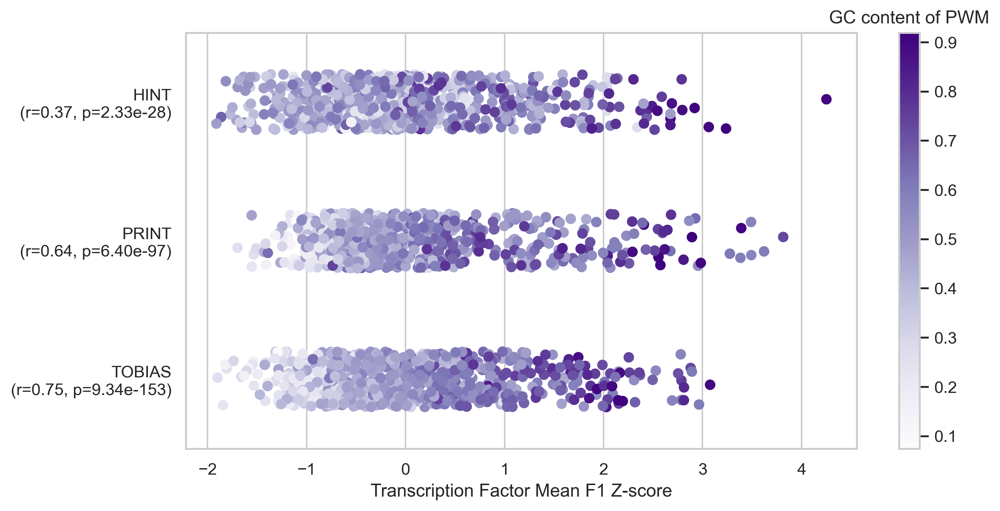

In [719]:
def _strip_plot(df, color_by, ax, colorpal = "Purples"):
    vals = np.array(df[color_by])
    cmap = plt.get_cmap(colorpal)
    norm = plt.Normalize(np.min(vals), np.max(vals))

    sc = sns.stripplot(data=df, x='mean', y='prog',  
                       jitter=0.2, hue=color_by, ax=ax, s=7, palette=cmap)
    
    sm =  matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    ax.legend_.remove()
    
    ax.set_ylabel("")
    ax.set_xlabel("Transcription Factor Mean F1 Z-score")
    
    res = df.groupby("prog").apply(lambda g: pearsonr(g[color_by], g["mean"]), include_groups=False)
    r_values = res.apply(lambda x: x[0]) 
    p_values = res.apply(lambda x: x[1])

    yticks = ax.get_yticks()
    yticklabels = [f"{cat.upper()}\n(r={r_values[cat]:.2f}, p={p_values[cat]:.2e})" for cat in r_values.index]

    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)

    return ax, cbar


sns.set(style='whitegrid')
fig = plt.figure(figsize=(10,5))
gs = GridSpec(1,1, figure=fig)
ax = fig.add_subplot(gs[0])
ax, cbar = _strip_plot(mean_zscore_df_info[(mean_zscore_df_info["sampling_type"] == "r")], 
                "GC_content", ax)
cbar.ax.set_title("GC content of PWM")

plt.show()


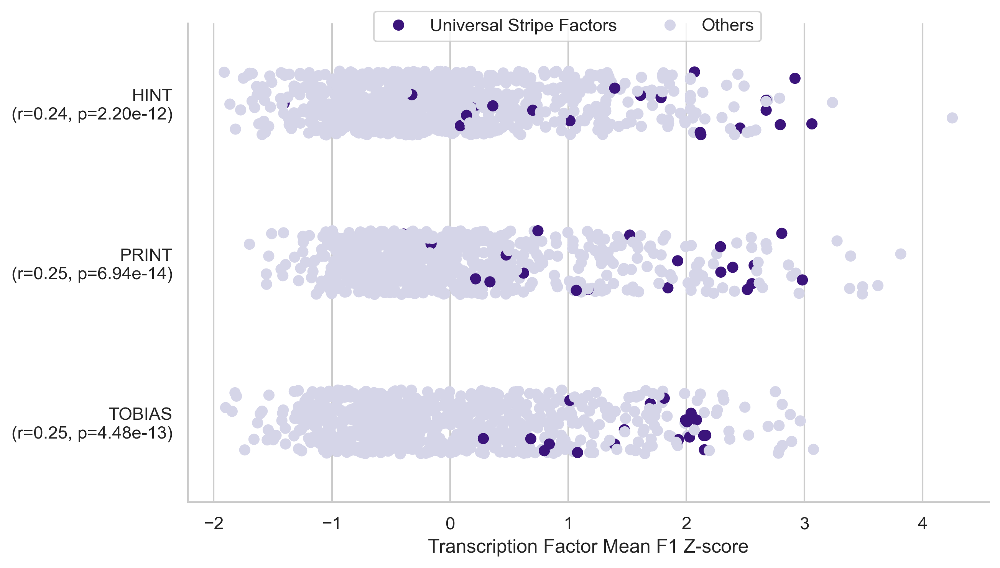

In [720]:
sns.set(style='whitegrid')
df = mean_zscore_df_info[(mean_zscore_df_info["sampling_type"] == "r")]
g = sns.catplot(data=df, x="mean", y="prog", jitter=0.2, hue="USF", size=7, 
                height=5, aspect=1.5, 
                palette={1: "#3B147B", 0:"#D5D5E8"}, hue_order=[1,0])
g.set_axis_labels("Transcription Factor Mean F1 Z-score", "")
g._legend.remove()
res = df.groupby("prog").apply(lambda g: pointbiserialr(g["USF"], g["mean"]), include_groups=False)
r_values = res.apply(lambda x: x[0]) 
p_values = res.apply(lambda x: x[1])

yticklabels = [f"{cat.upper()}\n(r={r_values[cat]:.2f}, p={p_values[cat]:.2e})" for cat in r_values.index]

g.set_yticklabels(yticklabels)
g.add_legend()
# sns.move_legend(g, "upper left", bbox_to_anchor=(0.9, 1), frameon=True,
#                 title=None, labels=["Universal Stripe Factors", "Others"])
sns.move_legend(g, "upper center", bbox_to_anchor=(0.5,1), frameon=True, ncol=2,
                title=None, labels=["Universal Stripe Factors", "Others"])

plt.show()

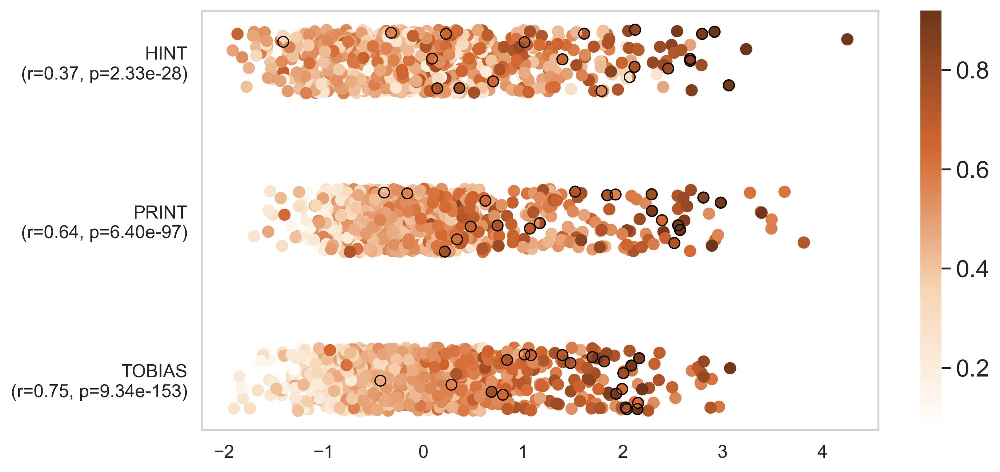

In [730]:
def custom_strip_plot(df, color_by, ax, cmap, outline_mask=None, jitter_strength=0.2):
    
    norm = plt.Normalize(df[color_by].min(), df[color_by].max())
    colors = cmap(norm(df[color_by].values))

    y_map = {cat: i for i, cat in enumerate(df['prog'].cat.categories)}
    y_vals = df['prog'].map(y_map).astype(float)
    df["jitter"] = y_vals + np.random.uniform(-jitter_strength, jitter_strength, size=len(y_vals))
    
    ax.scatter(data = df, x="mean", y="jitter", color=colors, s=50)
    ax.scatter(data = df[outline_mask], x="mean", y="jitter", s=50, color=colors, edgecolors='black', facecolors='none', linewidths=0.8)
    
    yticks = list(y_map.values())
    yticklabels = list(y_map.keys())

    res = df.groupby("prog").apply(lambda g: pearsonr(g[color_by], g["mean"]), include_groups=False)
    r_values = res.apply(lambda x: x[0]) 
    p_values = res.apply(lambda x: x[1])
    yticklabels = [f"{cat.upper()}\n(r={r_values[cat]:.2f}, p={p_values[cat]:.2e})" for cat in df['prog'].cat.categories]

    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)
    
    ax.set_ylabel("")

    sm = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)

    ax.tick_params(axis="y", labelsize=12)
    ax.tick_params(axis="x", labelsize=12)
    cbar.ax.tick_params(labelsize=16) 

    return ax, cbar


sns.set(style='white')
fig = plt.figure(figsize=(10,5))
gs = GridSpec(1,1, figure=fig)
ax = fig.add_subplot(gs[0])

tmp = mean_zscore_df_info[(mean_zscore_df_info["sampling_type"] == "r")].copy().reset_index()
tmp['prog'] = tmp['prog'].cat.reorder_categories(new_categories=["tobias","print","hint"], ordered=True)
outline_mask =tmp["USF"] ==1

#cmap = plt.get_cmap("Purples")
cmap = mcolors.LinearSegmentedColormap.from_list("white_to_custom", ["white", "#F6D5B3",  "#D46831", "#6D3519"])
ax, cbar = custom_strip_plot(tmp, color_by="GC_content", ax=ax, cmap=cmap, outline_mask=outline_mask)
ax.set_xlabel("")

ax.spines['left'].set_color('lightgrey')
ax.spines['right'].set_color('lightgrey')
ax.spines['top'].set_color('lightgrey')
ax.spines['bottom'].set_color('lightgrey')
cbar.outline.set_visible(False)

plt.savefig("../12_manuscript_figures/svg/Fig4_gccontent.svg")

plt.show()

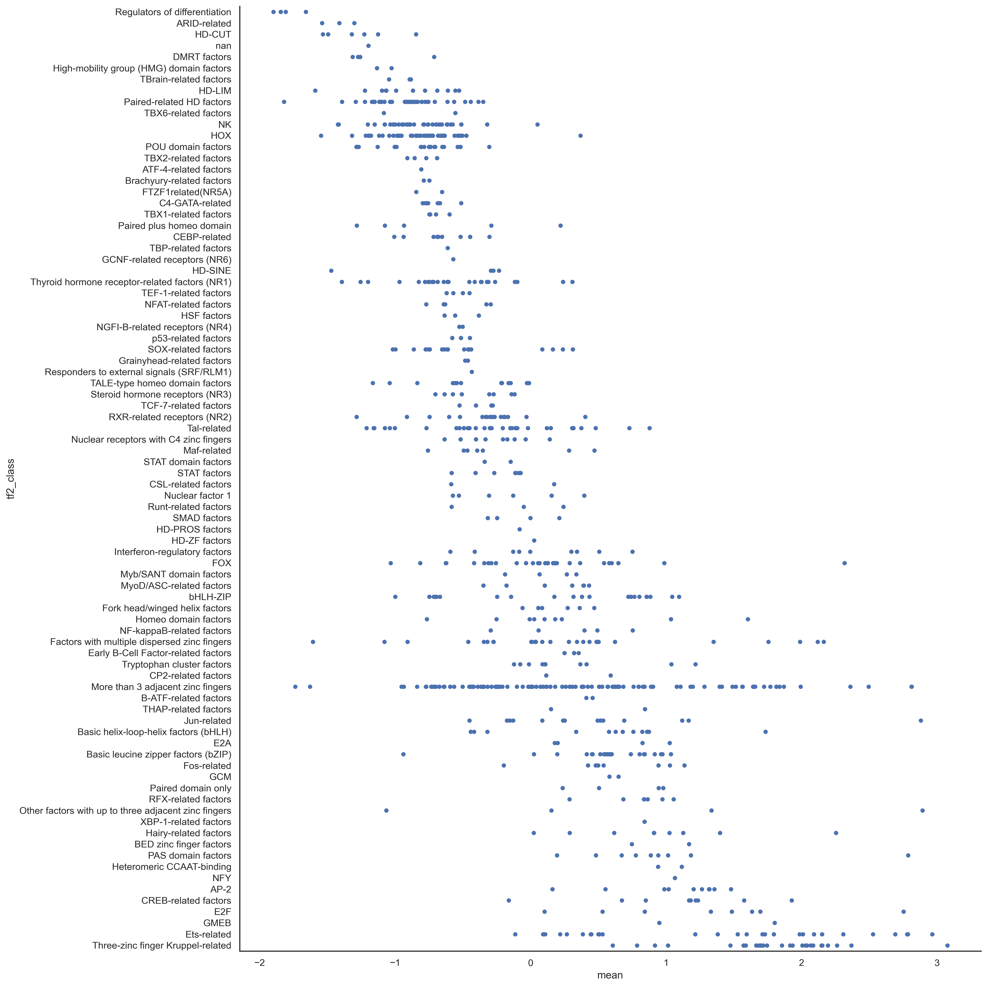

In [39]:
tmp = mean_zscore_df_info[(mean_zscore_df_info["sampling_type"] == "r") & (mean_zscore_df_info["prog"] == "tobias")]
aves = tmp.groupby('tf2_class')['mean'].mean().sort_values()
sns.catplot(data=tmp, x="mean", y="tf2_class", jitter=False, height=16, aspect=1, order=aves.index.tolist())
plt.show()

In [50]:
#Cell-type specific plots.

def quick(tool, cl):
    tmp = zscore_dict[tool]
    sub = tmp[(tmp["group"] == "r") & (tmp["cell_line"] == cl)].copy()
    sub["prog"] = tool
    return sub

CL = "HEPG2"
cl_zscore_df = pd.concat([quick("hint", CL),
                          quick("tobias", CL), 
                          quick("print", CL)])
print(cl_zscore_df.shape)
cl_zscore_df = pd.merge(cl_zscore_df, peak_prevalence[[CL]], left_on="TF", right_index=True, how='outer')

cl_zscore_df[["TF2", "motif"]] = cl_zscore_df["TF"].str.rsplit("_", n=1, expand=True)

rnaseq = "../09_simPWMs/ENCODE_bulkRNA/MeanExp.csv"
rnaseq_df = pd.read_csv(rnaseq, sep=",")
rnaseq_df.columns = [f"{i}_expression" for i in rnaseq_df.columns]

cl_zscore_df = cl_zscore_df.merge(rnaseq_df, left_on="TF2", right_on="GeneSymbol_expression", how='left')

cl_zscore_df['prog'] = cl_zscore_df['prog'].astype("category")
cl_zscore_df['prog'] = pd.Categorical(cl_zscore_df['prog'], categories=["tobias","print","hint"], ordered=True)

print(cl_zscore_df.shape)
display(cl_zscore_df)

(2523, 6)
(2523, 13)


,group,TF,cell_line,mean,std,prog,HEPG2,TF2,motif,GeneSymbol_expression,HEPG2_expression,GM12878_expression,K562_expression
0,r,AHR::ARNT_MA0006.1,HEPG2,1.231732,0.139268,hint,749324,AHR::ARNT,MA0006.1,NaN,NaN,NaN,NaN
1,r,AHR::ARNT_MA0006.1,HEPG2,0.618632,0.199174,tobias,749324,AHR::ARNT,MA0006.1,NaN,NaN,NaN,NaN
2,r,AHR::ARNT_MA0006.1,HEPG2,0.283663,0.245888,print,749324,AHR::ARNT,MA0006.1,NaN,NaN,NaN,NaN
3,r,ALX1_MA0854.1,HEPG2,-1.402730,0.183539,hint,204566,ALX1,MA0854.1,ALX1,0.9885,0.0095,0.065312
4,r,ALX1_MA0854.1,HEPG2,-0.933291,0.276843,tobias,204566,ALX1,MA0854.1,ALX1,0.9885,0.0095,0.065312
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2518,r,ZSCAN31_MA1722.1,HEPG2,0.144281,0.293843,tobias,5117,ZSCAN31,MA1722.1,ZSCAN31,4.0575,1.5900,4.339062
2519,r,ZSCAN31_MA1722.1,HEPG2,-0.241237,0.226062,print,5117,ZSCAN31,MA1722.1,ZSCAN31,4.0575,1.5900,4.339062
2520,r,ZSCAN4_MA1155.1,HEPG2,-0.588604,0.112182,hint,34510,ZSCAN4,MA1155.1,ZSCAN4,0.4190,0.0200,0.001875
2521,r,ZSCAN4_MA1155.1,HEPG2,-0.424407,0.054237,tobias,34510,ZSCAN4,MA1155.1,ZSCAN4,0.4190,0.0200,0.001875


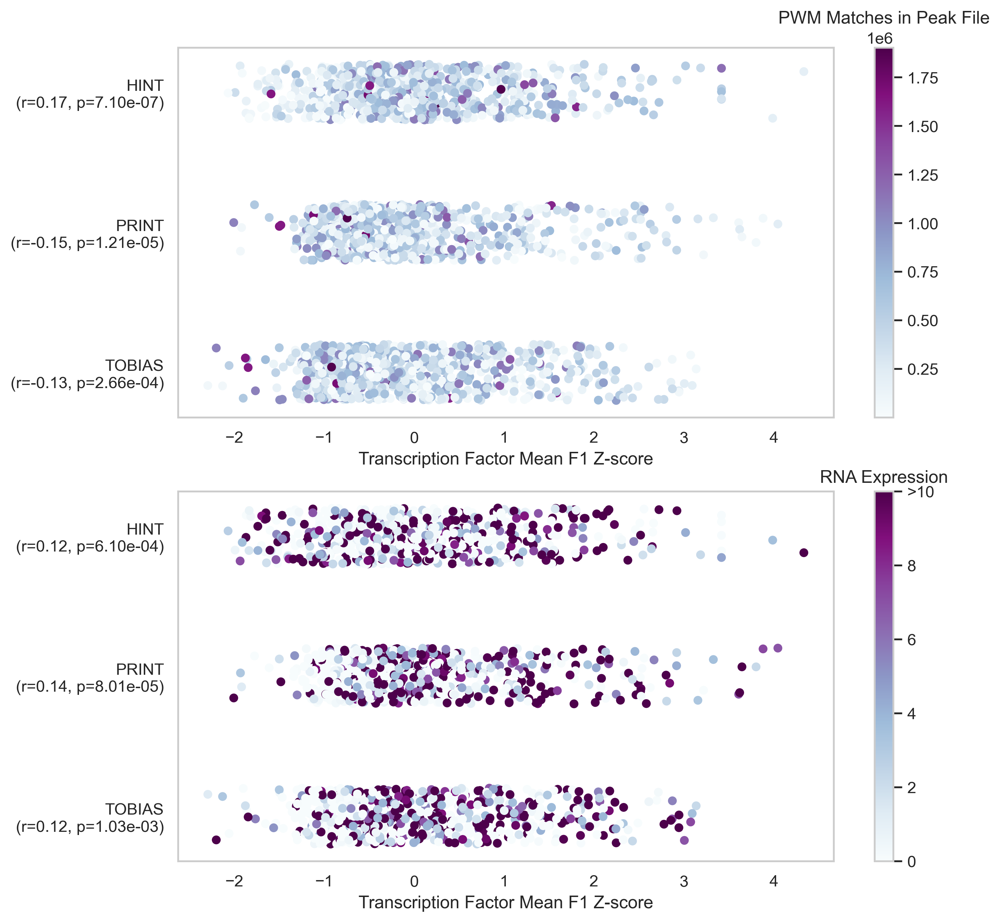

In [58]:
def matplotlibistheworstjfc(df, color_by, ax, jitter=0.2, colpal="Blues", vmax=None):
    categories = df["prog"].astype("category").cat.categories
    y_numeric = df["prog"].astype("category").cat.codes
    y_jittered = y_numeric + np.random.uniform(-jitter, jitter, size=len(y_numeric))

    if vmax:
        sc = ax.scatter(x=df['mean'],  y=y_jittered,
                        c=df[color_by],
                        cmap=colpal, vmin=0, vmax=vmax, edgecolor="#D3D3D3", linewidth=0)
    else:
        sc = ax.scatter(x=df['mean'],  y=y_jittered,
                        c=df[color_by],
                        cmap=colpal, edgecolor="#D3D3D3", linewidth=0)
    
    
    cbar = plt.colorbar(sc, ax=ax)


    ax.set_ylabel("")
    ax.set_xlabel("Transcription Factor Mean F1 Z-score")

    
    res = df[~df[color_by].isna()].groupby("prog").apply(lambda g: pearsonr(g[color_by], g["mean"]), include_groups=False)
    r_values = res.apply(lambda x: x[0]) 
    p_values = res.apply(lambda x: x[1])
    
    yticks = np.arange(len(categories))
    yticklabels = [f"{cat.upper()}\n(r={r_values[cat]:.2f}, p={p_values[cat]:.2e})" for cat in r_values.index]

    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels)
    return ax, cbar

sns.set(style='white')
plt.rcParams['axes.edgecolor'] = '#CCCCCC' 

fig = plt.figure(figsize=(10,10))
gs = GridSpec(2,1, figure=fig, wspace=0.4)

ax = fig.add_subplot(gs[0])

ax, cbar = matplotlibistheworstjfc(cl_zscore_df, CL, ax, colpal="BuPu")
cbar.ax.set_title("PWM Matches in Peak File")

ax = fig.add_subplot(gs[1])
ax, cbar = matplotlibistheworstjfc(cl_zscore_df, f"{CL}_expression", ax, colpal="BuPu", vmax=10)

#cbar.set_label("RNA expression")
cbar.set_ticks([0, 2, 4, 6, 8, 10])
cbar.set_ticklabels(["0", "2", "4", "6", "8", ">10"])  # Explicitly set tick labels
cbar.ax.set_title("RNA Expression")


plt.savefig("../12_manuscript_figures/svg/FigS4_peak_expr.svg")
plt.show()

# 5. How do z-scores change by tool? <a class="anchor" id="fifth-bullet"></a>

In [59]:
## Is there agreement across top and bottom quantiles?
tmp = mean_zscore_df[mean_zscore_df.sampling_type == "r"]

mean_zscore_df_wide = tmp[["TF", "mean","prog"]].pivot(index='TF',columns='prog').reset_index()
mean_zscore_df_wide.columns = mean_zscore_df_wide.columns.map('_'.join)
mean_zscore_df_wide["overall_mean"] = mean_zscore_df_wide[["mean_hint", "mean_print", "mean_tobias"]].mean(axis=1)
display(mean_zscore_df_wide)

,TF_,mean_hint,mean_print,mean_tobias,overall_mean
0,AHR::ARNT_MA0006.1,1.289819,0.385416,0.872530,0.849255
1,ALX1_MA0854.1,-1.520227,-0.999317,-1.024129,-1.181224
2,ALX3_MA0634.1,-0.538145,-0.866716,-1.104113,-0.836324
3,ALX4_MA0853.1,-1.587609,-0.976387,-0.854158,-1.139384
4,ARGFX_MA1463.1,-0.701865,-1.059312,-1.079483,-0.946886
...,...,...,...,...,...
836,ZNF8_MA1718.1,-1.673919,-1.075325,-1.078990,-1.276078
837,ZNF93_MA1721.1,0.764701,1.786766,2.360717,1.637394
838,ZSCAN29_MA1602.1,-0.298067,-0.148313,0.422099,-0.008094
839,ZSCAN31_MA1722.1,-1.342615,-0.151035,0.146245,-0.449135


In [60]:
top25 = {}
bottom25 = {}

for tool in ["hint", "tobias", "print"]:
    thresh = mean_zscore_df_wide[f"mean_{tool}"].quantile(0.75)
    vals = mean_zscore_df_wide[mean_zscore_df_wide[f"mean_{tool}"] >= thresh]["TF_"].values
    top25[tool] = set(vals)
    
    thresh = mean_zscore_df_wide[f"mean_{tool}"].quantile(0.25)
    vals = mean_zscore_df_wide[mean_zscore_df_wide[f"mean_{tool}"] <= thresh]["TF_"].values
    bottom25[tool] = set(vals)
    

for setlist, name in zip([top25, bottom25], ["top 25%", "bottom 25%"]):
    intersection = len(setlist["hint"] & setlist["tobias"] & setlist["print"])
    union = len(setlist["hint"] | setlist["tobias"] | setlist["print"])
    denom = min([len(setlist[i]) for i in setlist.keys()])
    
    print(f"-- jaccard similarity for {name} is {intersection/union :.2f}")
    print(f"-- overlap coefficient for {name} is {intersection/denom :.2f}")

    
print("\nThe respective overlap percentages are as follows:")
denom = len(top25["hint"])
for i,j in itertools.combinations(top25.keys(), 2):
    v1 = (len( top25[i] & top25[j])/denom)*100
    v2 = (len( bottom25[i] & bottom25[j])/denom)*100
    
    js1 = len(top25[i] & top25[j]) / len(top25[i] | top25[j])
    js2 = len(bottom25[i] & bottom25[j]) / len(bottom25[i] | bottom25[j])
    print(f"--- {i} and {j} overlap: \n\t{v1:.2f}% ({js1:.2f}) in top performing and")
    print(f"\t{v2:.2f}% ({js2:.2f}) in bottom performing")

-- jaccard similarity for top 25% is 0.40
-- overlap coefficient for top 25% is 0.57
-- jaccard similarity for bottom 25% is 0.14
-- overlap coefficient for bottom 25% is 0.26

The respective overlap percentages are as follows:
--- hint and tobias overlap: 
	65.40% (0.49) in top performing and
	30.81% (0.18) in bottom performing
--- hint and print overlap: 
	65.40% (0.49) in top performing and
	33.18% (0.20) in bottom performing
--- tobias and print overlap: 
	84.36% (0.73) in top performing and
	80.09% (0.67) in bottom performing


In [61]:
above1 = {}
below1 = {}

for tool in ["hint", "tobias", "print"]:
    vals = mean_zscore_df_wide[mean_zscore_df_wide[f"mean_{tool}"] >= 1]["TF_"].values
    above1[tool] = set(vals)
    vals = mean_zscore_df_wide[mean_zscore_df_wide[f"mean_{tool}"] <= -1]["TF_"].values
    below1[tool] = set(vals)
    

for setlist, name in zip([above1, below1], ["mean > 1", "mean < -1"]):
    intersection = len(setlist["hint"] & setlist["tobias"] & setlist["print"])
    union = len(setlist["hint"] | setlist["tobias"] | setlist["print"])
    denom = min([len(setlist[i]) for i in setlist.keys()])
    
    print(f"-- jaccard similarity for {name} is {intersection/union :.2f}")
    print(f"-- overlap coefficient for {name} is {intersection/denom :.2f}")

print("\nThe respective overlap percentages are as follows:")
for i,j in itertools.combinations(above1.keys(), 2):
    js1 = len(above1[i] & above1[j]) / len(above1[i] | above1[j])
    js2 = len(below1[i] & below1[j]) / len(below1[i] | below1[j])
    
    print(f"--- {i} and {j} overlap: \n\t{js1:.2f} in mean > 1 and\n\t{js2:.2f} in mean < -1")

-- jaccard similarity for mean > 1 is 0.34
-- overlap coefficient for mean > 1 is 0.54
-- jaccard similarity for mean < -1 is 0.09
-- overlap coefficient for mean < -1 is 0.36

The respective overlap percentages are as follows:
--- hint and tobias overlap: 
	0.38 in mean > 1 and
	0.16 in mean < -1
--- hint and print overlap: 
	0.46 in mean > 1 and
	0.13 in mean < -1
--- tobias and print overlap: 
	0.64 in mean > 1 and
	0.32 in mean < -1


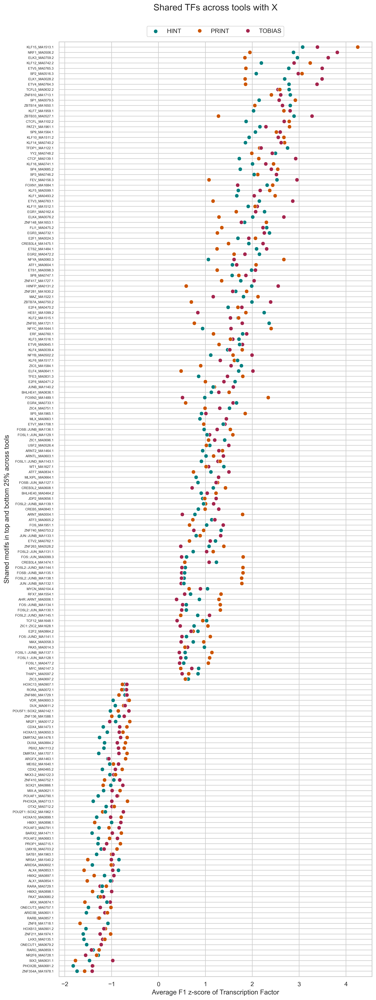

In [62]:


ofinterest1 = list(top25["hint"] & top25["tobias"] & top25["print"])
ofinterest2 = list(bottom25["hint"] & bottom25["tobias"] & bottom25["print"])

# ofinterest1 = list(above1["hint"] & above1["tobias"] & above1["print"])
# ofinterest2 = list(below1["hint"] & below1["tobias"] & below1["print"])

tmp = mean_zscore_df[mean_zscore_df.sampling_type == "r"].copy()
tmp['TF'] = tmp.TF.astype(str)
tmp = tmp[tmp["TF"].isin(ofinterest1+ofinterest2)]
tf_order = mean_zscore_df_wide[mean_zscore_df_wide["TF_"].isin(ofinterest1+ofinterest2)].sort_values("overall_mean", ascending=True)["TF_"]
tmp["TF"] = pd.Categorical(tmp["TF"], categories=tf_order, ordered=True)
tmp.sort_values(by='TF', ascending=True, inplace=True)



sns.set(style='whitegrid')
fig = plt.figure(figsize=(10,30))
gs = GridSpec(1,1, figure=fig)

ax = fig.add_subplot(gs[0])

sns.scatterplot(data=tmp, 
                x='mean', 
                y='TF', hue="prog", 
                palette=color_scheme_prog, 
                s=50)

ax.set_xlabel('Average F1 z-score of Transcription Factor')
ax.set_ylabel("Shared motifs in top and bottom 25% across tools")
ax.set_title("Shared TFs across tools with X", y=1.03, fontsize=16)



miny, _, *_, maxy = ax.get_yticks()
ax.set_ylim(maxy+1, miny-1)
ax.invert_yaxis()

_, ylabels = plt.yticks()
ax.set_yticks(ax.get_yticks())
ax.set_yticklabels(ylabels, size=6)

handles, labels = ax.get_legend_handles_labels() 
ax.legend(loc='upper center', title=None, 
          bbox_to_anchor=(0.5,1.02), 
          frameon=True, ncol=3, labels=[i.upper() for i in labels])


plt.savefig("../12_manuscript_figures/svg/FigS2_top_quantiles.svg")
plt.savefig("../12_manuscript_figures/pdf/FigS2_top_quantiles.pdf", bbox_inches='tight')


plt.show()

# 6. Can we find cell-type specific TFs? <a class="anchor" id="sixth-bullet"></a>

- Given what we know below, the matched data quality is very important so re-running this with 20K cells

In [792]:
def _get_first_file(data_dir, prefix):
    for f in os.listdir(data_dir):
       if f.startswith(prefix):
           return f"{data_dir}/{f}"
           

tp_records = []
for prog in ["hint", "tobias", "print"]:
    if prog == "hint":
        data_dir = f"../06_dataquality/hint/metrics/no_threshold/"
    elif prog == "tobias":
        data_dir = f"../06_dataquality/tobias/metrics/bound_threshold/"
    elif prog == "print":
        data_dir = f"../06_dataquality/print/metrics/thresh_03/"

    for cl in ["HEPG2", "K562", "MCF7", "SKNSH", "GM12878"]:
        input_file = _get_first_file(data_dir, f"{cl}_c20000")
        #input_file = f"{data_dir}/{cl}_metrics.csv"
        df = pd.read_csv(input_file, index_col=0)
        df = df.loc[df["type"] == "tf"]
        df = df.sort_index(ascending=True)

        #TP are just the number of footprints in this cell line. 
        ztp = zscore(df["TP"])  # 1D array
        for tf, val in zip(df.index, ztp):
            tp_records.append({
                "prog": prog,
                "cell_line": cl,
                "TF": tf,
                "zTP": val
            })

long_df = pd.DataFrame(tp_records)
display(long_df)


,prog,cell_line,TF,zTP
0,hint,HEPG2,AHR::ARNT_MA0006.1,0.049700
1,hint,HEPG2,ALX1_MA0854.1,-0.853774
2,hint,HEPG2,ALX3_MA0634.1,-0.701416
3,hint,HEPG2,ALX4_MA0853.1,-0.883081
4,hint,HEPG2,ARGFX_MA1463.1,-0.673079
...,...,...,...,...
12610,print,GM12878,ZNF8_MA1718.1,-0.635361
12611,print,GM12878,ZNF93_MA1721.1,1.103969
12612,print,GM12878,ZSCAN29_MA1602.1,-0.835665
12613,print,GM12878,ZSCAN31_MA1722.1,-0.594878


In [793]:
def _build_obs_exp_df(df, val_column = "zTP"):
    final_df = pd.DataFrame()
    
    for cl in np.unique(df.cell_line):

        #for all cell lines, not the one of interest, get mean/std 
        df_others = df[df.cell_line != cl].groupby("TF", observed=True)[val_column].agg(['mean', 'std']).reset_index()
        df_others = df_others.sort_values("TF")
        df_others.columns = ["name", "expected_mean", "expected_sd"]

        #for the cell line of interest. 
        df_others["observed"] = df.loc[df.cell_line == cl][val_column].values
        df_others["o-e"] = (df_others["observed"] - df_others["expected_mean"])/df_others["expected_sd"]
        df_others["cell_line"] = cl
        
        final_df = pd.concat([final_df, df_others])
    
    return final_df

## BUILD OBSERVED-EXPECTED DF FOR FOOTPRINTING
pt1 = _build_obs_exp_df(df = long_df[long_df.prog == "hint"], val_column = "zTP")
pt1["tool"] = "hint"
pt2 = _build_obs_exp_df(df = long_df[long_df.prog == "tobias"], val_column = "zTP")
pt2["tool"] = "tobias"
pt3 = _build_obs_exp_df(df = long_df[long_df.prog == "print"], val_column = "zTP")
pt3["tool"] = "print"
df_FT = pd.concat([pt1, pt2, pt3])
df_FT[["TF", "motif"]] = df_FT["name"].str.rsplit("_", n=1, expand=True)
display(df_FT) 

## BUILD OBSERVED-EXPECTED DF FOR RNASEQ
rnaseq = "../09_simPWMs/ENCODE_bulkRNA/ENCODE_polyAplus.csv"
rnaseq_df = pd.read_csv(rnaseq, sep=",")
rnaseq_df = rnaseq_df.melt(var_name='cell_line', id_vars="GeneSymbol", value_name='expression')
rnaseq_df.rename(columns={'GeneSymbol': 'TF'}, inplace=True)
df_RNA = _build_obs_exp_df(rnaseq_df, "expression")
df_RNA = df_RNA.add_suffix('_RNA')
display(df_RNA)

,name,expected_mean,expected_sd,observed,o-e,cell_line,tool,TF,motif
0,AHR::ARNT_MA0006.1,0.077987,0.095729,0.083307,0.055570,GM12878,hint,AHR::ARNT,MA0006.1
1,ALX1_MA0854.1,-0.808382,0.065094,-0.728298,1.230292,GM12878,hint,ALX1,MA0854.1
2,ALX3_MA0634.1,-0.566931,0.114395,-0.439985,1.109726,GM12878,hint,ALX3,MA0634.1
3,ALX4_MA0853.1,-0.838051,0.066969,-0.780321,0.862040,GM12878,hint,ALX4,MA0853.1
4,ARGFX_MA1463.1,-0.566350,0.113246,-0.414410,1.341674,GM12878,hint,ARGFX,MA1463.1
...,...,...,...,...,...,...,...,...,...
836,ZNF8_MA1718.1,-0.659030,0.037044,-0.557997,2.727362,SKNSH,print,ZNF8,MA1718.1
837,ZNF93_MA1721.1,0.992760,0.110009,1.206214,1.940331,SKNSH,print,ZNF93,MA1721.1
838,ZSCAN29_MA1602.1,-0.800087,0.061310,-0.669890,2.123586,SKNSH,print,ZSCAN29,MA1602.1
839,ZSCAN31_MA1722.1,-0.568642,0.039286,-0.472361,2.450793,SKNSH,print,ZSCAN31,MA1722.1


,name_RNA,expected_mean_RNA,expected_sd_RNA,observed_RNA,o-e_RNA,cell_line_RNA
0,A1BG,18.577926,11.484784,8.533333,-0.874600,GM12878
1,A1BG-AS1,6.819185,6.686465,3.175833,-0.544885,GM12878
2,A1CF,8.528642,17.048784,0.000000,-0.500249,GM12878
3,A2M,572.126602,1144.096205,0.088333,-0.499991,GM12878
4,A2M-AS1,0.708793,0.782682,0.026667,-0.871524,GM12878
...,...,...,...,...,...,...
37791,ZYG11B,3.917443,0.896618,6.478000,2.855795,SKNSH
37792,ZYX,38.511316,11.891326,254.318000,18.148243,SKNSH
37793,ZYXP1,0.000000,0.000000,0.000000,NaN,SKNSH
37794,ZZEF1,11.203954,6.050140,11.040000,-0.027099,SKNSH


In [794]:
#MERGE THEM
df = df_FT.merge(df_RNA, left_on=["TF", "cell_line"], right_on=["name_RNA", "cell_line_RNA"], how='left')


## FIX THE COMPOSITE MOTIFS
#taking the max of the individual scores. 
composite_motifs = np.unique([i for i in df.TF if "::" in i])
cols_to_replace = ['name_RNA', 'expected_mean_RNA', 'expected_sd_RNA', 'observed_RNA', 'o-e_RNA', "cell_line_RNA"]

for cm in composite_motifs:
    tfs = cm.split("::") # e.g., ['ARNT', 'HIF1A']
    
    for cl, gb in df[(df["TF"].isin(tfs))].groupby("cell_line"):
        top_row = gb.sort_values("o-e_RNA", ascending=False).iloc[0] 
        df.loc[(df.TF == cm) & (df.cell_line == cl), cols_to_replace] = top_row[cols_to_replace].values


## Fix some other odd issues. 
#1. if observed is 0, set to 0 not NaN
df.loc[np.isnan(df["o-e_RNA"]) & (df["observed_RNA"] == 0), "o-e_RNA"] = 0

#2. if sd was 0, recalculate to avoid Inf
mask = df["expected_sd_RNA"] == 0
df.loc[mask, "o-e_RNA"] = df[mask]["observed_RNA"] - df[mask]["expected_mean_RNA"]

#3. Lastly, we're just missing some
print(f'Missing expression values for the following TFs: {np.unique(df[np.isnan(df["o-e_RNA"])]["name"])}')


Missing expression values for the following TFs: ['BACH1_MA1633.2' 'DUX_MA0611.2' 'EWSR1-FLI1_MA0149.1' 'MIX-A_MA0621.1'
 'MSX3_MA0709.1' 'RHOX11_MA0629.1' 'ZFP335_MA2002.1']


In [795]:
#BACH1 not there but BACH1-AS1, BACH1-IT2, and BACH1-IT3 are. 
#'DUX_MA0611.2'  'MSX3_MA0709.1' 'RHOX11_MA0629.1' 'ZFP335_MA2002.1' only in mice. 
#MIX-A_MA0621.1 is laevis specific 
# 'EWSR1-FLI1_MA0149.1' is a fusion protein between EWSR1 and FLI1 in an oncogenic event.

In [796]:
df["RNA_expression_bool"] = [1 if i > 1 else 0 for i in df.observed_RNA]
df["RNA_expression_bool"] = df["RNA_expression_bool"].astype('category')
df["RNA_expression_bool"] = df["RNA_expression_bool"].cat.reorder_categories([0,1])

#change to be the top 20% 
df["CellType_specific_bool"] = 0
for cl, tmp in df.groupby("cell_line"):
    cl_specific = np.unique(tmp[(tmp["o-e_RNA"] > tmp["o-e_RNA"].quantile(0.8))]["name"])
    df.loc[(df.cell_line == cl) & (df.name.isin(cl_specific)), "CellType_specific_bool"] = 1

print(df["CellType_specific_bool"].value_counts())
# df["CellType_specific_bool"] = [1 if i > 0.5 else 0 for i in df["o-e_RNA"]]
df["CellType_specific_bool"] = df["CellType_specific_bool"].astype('category')
df["CellType_specific_bool"] = df["CellType_specific_bool"].cat.reorder_categories([0,1])

df["rank_global"] = df.groupby(["cell_line", "tool"])["o-e"].rank(ascending=False)

display(df)

CellType_specific_bool
0    10116
1     2499
Name: count, dtype: int64


,name,expected_mean,expected_sd,observed,o-e,cell_line,tool,TF,motif,name_RNA,expected_mean_RNA,expected_sd_RNA,observed_RNA,o-e_RNA,cell_line_RNA,RNA_expression_bool,CellType_specific_bool,rank_global
0,AHR::ARNT_MA0006.1,0.077987,0.095729,0.083307,0.055570,GM12878,hint,AHR::ARNT,MA0006.1,ARNT,23.321222,8.054759,17.890833,-0.674184,GM12878,1,0,419.0
1,ALX1_MA0854.1,-0.808382,0.065094,-0.728298,1.230292,GM12878,hint,ALX1,MA0854.1,ALX1,0.145293,0.225301,0.009167,-0.604195,GM12878,0,0,228.0
2,ALX3_MA0634.1,-0.566931,0.114395,-0.439985,1.109726,GM12878,hint,ALX3,MA0634.1,ALX3,0.029156,0.051473,0.002500,-0.517864,GM12878,0,0,244.0
3,ALX4_MA0853.1,-0.838051,0.066969,-0.780321,0.862040,GM12878,hint,ALX4,MA0853.1,ALX4,0.090636,0.135766,0.000833,-0.661454,GM12878,0,0,271.0
4,ARGFX_MA1463.1,-0.566350,0.113246,-0.414410,1.341674,GM12878,hint,ARGFX,MA1463.1,ARGFX,0.016000,0.018547,0.000000,-0.862662,GM12878,0,0,210.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12610,ZNF8_MA1718.1,-0.659030,0.037044,-0.557997,2.727362,SKNSH,print,ZNF8,MA1718.1,ZNF8,1.974020,0.489448,2.802000,1.691659,SKNSH,1,0,86.0
12611,ZNF93_MA1721.1,0.992760,0.110009,1.206214,1.940331,SKNSH,print,ZNF93,MA1721.1,ZNF93,4.715483,3.775687,4.498000,-0.057601,SKNSH,1,0,183.0
12612,ZSCAN29_MA1602.1,-0.800087,0.061310,-0.669890,2.123586,SKNSH,print,ZSCAN29,MA1602.1,ZSCAN29,9.897694,1.883699,10.442000,0.288956,SKNSH,1,0,152.0
12613,ZSCAN31_MA1722.1,-0.568642,0.039286,-0.472361,2.450793,SKNSH,print,ZSCAN31,MA1722.1,ZSCAN31,4.143078,1.736638,2.644000,-0.863207,SKNSH,1,0,113.0


## 6.1 Distribution plots <a class="anchor" id="sixth1-bullet"></a>

In [797]:
from statsmodels.stats.multitest import multipletests

def _permtest(group1, group2):
    res = permutation_test((group1, group2), 
                       statistic=lambda x, y: np.mean(x) - np.mean(y), 
                       n_resamples=10000, alternative='greater')
    return res

perm_list = []
for t, cl in zip(["hint", "tobias", "print"] *5, ["HEPG2", "K562", "GM12878", "SKNSH", "MCF7"]*3):
    tmp = df[(df.tool == t) & (df.cell_line == cl)]

    res1 = _permtest(tmp.loc[tmp["RNA_expression_bool"] ==1, "o-e"], 
                    tmp.loc[tmp["RNA_expression_bool"] ==0, "o-e"])
    res2 = _permtest(tmp.loc[tmp["CellType_specific_bool"] ==1, "o-e"], 
                    tmp.loc[tmp["CellType_specific_bool"] ==0, "o-e"])
    perm_list.append([t, cl, res1.pvalue, res2.pvalue])

tmp = pd.DataFrame(perm_list, columns=["tool", "cell line", "RNA pval", "CT-specific pval"])
tmp["adjusted_CT_pval"] = multipletests(tmp["CT-specific pval"], method="fdr_bh")[1]

tmp["asterisk"] = ""
tmp.loc[tmp["adjusted_CT_pval"] < 0.05, "asterisk"] = "*"
tmp.loc[tmp["adjusted_CT_pval"] < 0.001, "asterisk"] = "**"
tmp.loc[tmp["adjusted_CT_pval"] < 0.0001, "asterisk"] = "***"
display(tmp)

,tool,cell line,RNA pval,CT-specific pval,adjusted_CT_pval,asterisk
0,hint,HEPG2,0.000100,0.000100,0.000300,**
1,tobias,K562,0.864114,0.100290,0.136759,
2,print,GM12878,0.000600,0.000100,0.000300,**
3,hint,SKNSH,0.665833,0.989301,0.989301,
4,tobias,MCF7,0.265673,0.051295,0.085491,
5,print,HEPG2,0.000100,0.000100,0.000300,**
6,hint,K562,0.005899,0.034197,0.064119,
7,tobias,GM12878,0.053895,0.004100,0.008785,*
8,print,SKNSH,0.968803,0.376762,0.434726,
9,hint,MCF7,0.217078,0.143686,0.179607,


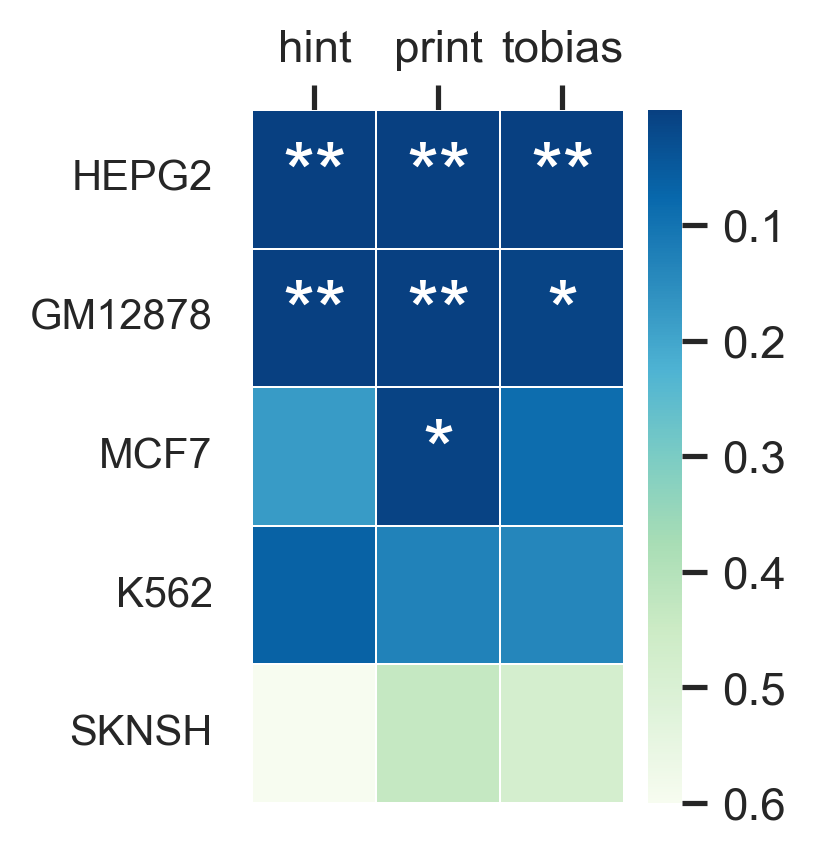

In [798]:
toplot = tmp.pivot(index='cell line', columns='tool', values='adjusted_CT_pval')
labels = tmp.pivot(index='cell line', columns='tool', values='asterisk')
col_order = ['hint', 'print', 'tobias']
row_order = ["HEPG2", "GM12878", "MCF7", "K562", "SKNSH"]

plt.figure(figsize=(2,3))
ax= sns.heatmap(toplot.loc[row_order, col_order],
            annot = labels.loc[row_order, col_order],
            fmt = '', annot_kws={"size": 20}, 
            linewidths=0.05, linecolor='white',
            cmap="GnBu_r",  vmax=0.6)


ax.yaxis.set_tick_params(labelsize=10) 
ax.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
plt.gcf().axes[1].invert_yaxis()
plt.ylabel(""); plt.xlabel("")

plt.savefig(f"../12_manuscript_figures/svg/Fig5_CT_permtest.svg")
plt.show()

In [799]:
np.unique(df.cell_line)[0]

'GM12878'

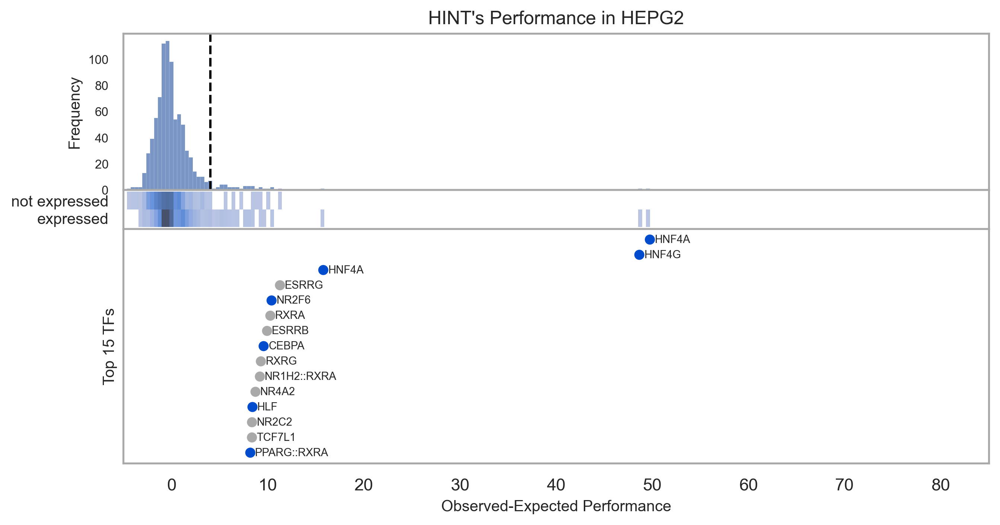

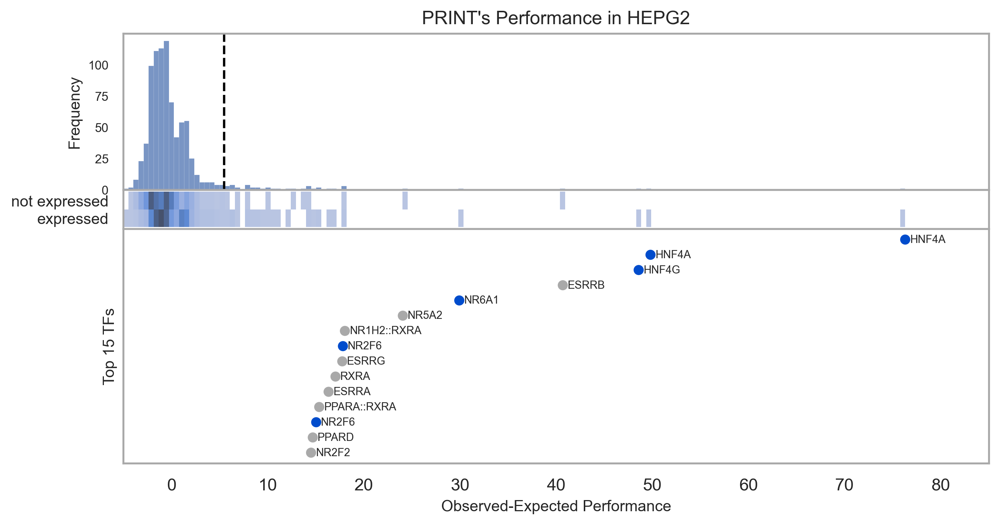

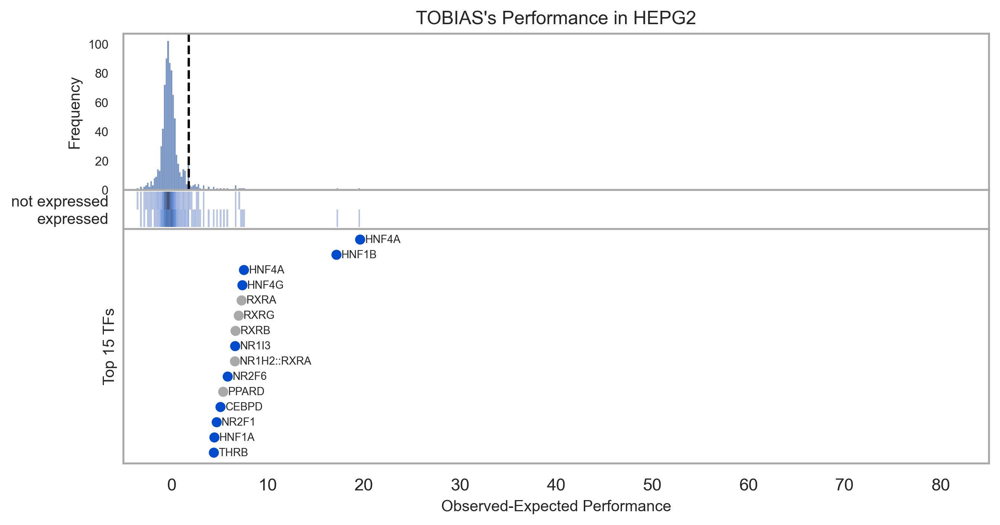

In [800]:
from scipy.stats import permutation_test
    
def _threetierplot(df, xlim=(-5, 85), save=False):  

    def _ax_spline(ax):
        ax.spines['left'].set_color('darkgrey')
        ax.spines['right'].set_color('darkgrey')
        ax.spines['top'].set_color('darkgrey')
        ax.spines['bottom'].set_color('darkgrey')
        return ax
        
    sns.set(style='white')

    cl = np.unique(df.cell_line)[0]
    tool = np.unique(df.tool)[0]
    
    sns.set(style='white')
    fig = plt.figure(figsize=(10,5))
    gs = GridSpec(3,1, figure=fig, wspace=0, height_ratios=[4,1,6], hspace=0)

    ax0 = fig.add_subplot(gs[0])
    sns.histplot(data=df, x='o-e', ax=ax0, linewidth=0.05)
    plt.axvline(x=np.quantile(df["o-e"], 0.95), color='black', linestyle='--')
    
    ax1 = fig.add_subplot(gs[1], sharex=ax0)
    sns.histplot(data=df, y="RNA_expression_bool", x="o-e", ax=ax1)

    ax2 = fig.add_subplot(gs[2], sharex=ax0)
    tmp = pd.concat([df.nlargest(15, "o-e")])
    tmp["rank"] = tmp["o-e"].rank()
    sns.scatterplot(data=tmp, x='o-e', y="rank", s=50, hue="CellType_specific_bool", ax=ax2, palette={0:"darkgrey", 1:"#004CCC"})
    
    for i, row in tmp.iterrows():
        ax2.text(row['o-e']+0.5, row['rank']-0.2, row['TF'], fontsize=7) 

    ax0.set_title(f"{tool.upper()}'s Performance in {cl}", fontsize=12)
    ax0.set_xlabel("")
    ax0.tick_params(axis="x", labelbottom=False)
    ax0.tick_params(axis="y", labelbottom=False, labelsize=8)
    ax0.set_ylabel("Frequency", fontsize=10)
    ax0.set_xlim(xlim)

    ax1.set_ylabel("")
    ax1.set_yticks([0,1])
    ax1.set_yticklabels(["not expressed", "expressed"], fontsize=10)
    ax1.tick_params(axis="x", labelbottom=False); ax1.set_xlabel("")
    ax1.set_xlim(xlim)

    ax2.set_ylabel("Top 15 TFs", fontsize=10)
    ax2.set_yticks([])
    ax2.xaxis.set_visible(True)
    ax2.tick_params(axis="x", labelbottom=True)
    ax2.set_xlabel("Observed-Expected Performance", fontsize=10)
    ax2.legend_.remove()
    ax2.set_xlim(xlim)

    ax0 = _ax_spline(ax0)
    ax1 = _ax_spline(ax1)
    ax2 = _ax_spline(ax2)
    
    if save:
        plt.savefig(f"../12_manuscript_figures/svg/FigS5_O-E_{cl}_{tool}.svg")

    plt.show()
    
_threetierplot(df[(df.tool == "hint") & (df.cell_line == "HEPG2")], save=True)
_threetierplot(df[(df.tool == "print") & (df.cell_line == "HEPG2")], save=True)
_threetierplot(df[(df.tool == "tobias") & (df.cell_line == "HEPG2")], save=True)

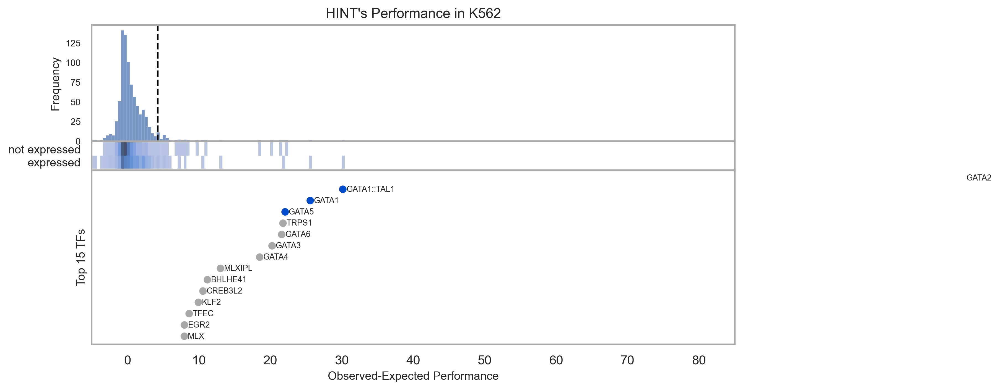

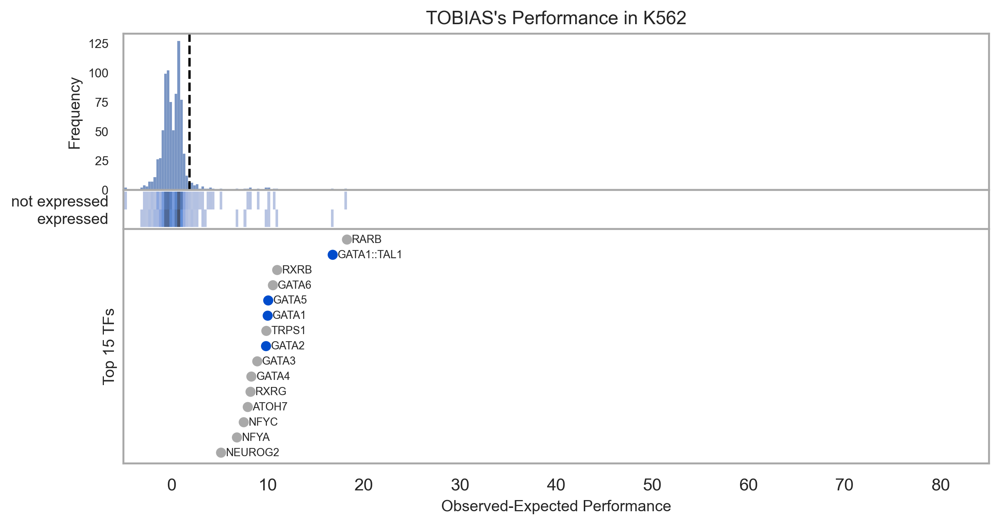

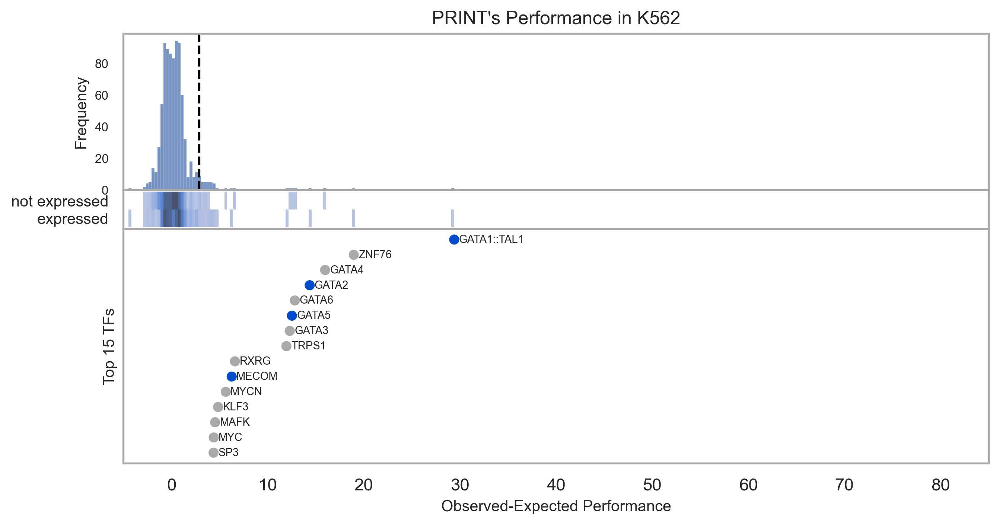

In [801]:
_threetierplot(df[(df.tool == "hint") & (df.cell_line == "K562")])
_threetierplot(df[(df.tool == "tobias") & (df.cell_line == "K562")])
_threetierplot(df[(df.tool == "print") & (df.cell_line == "K562")])

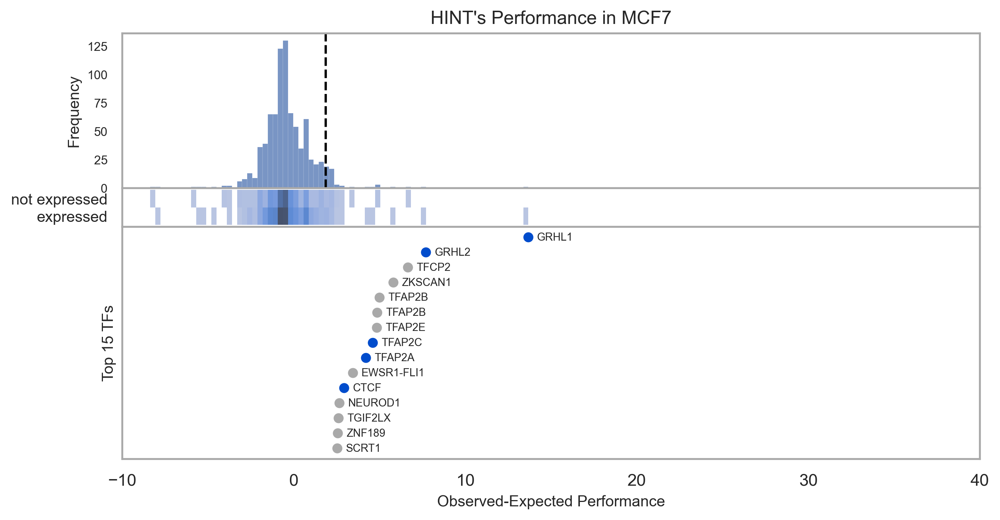

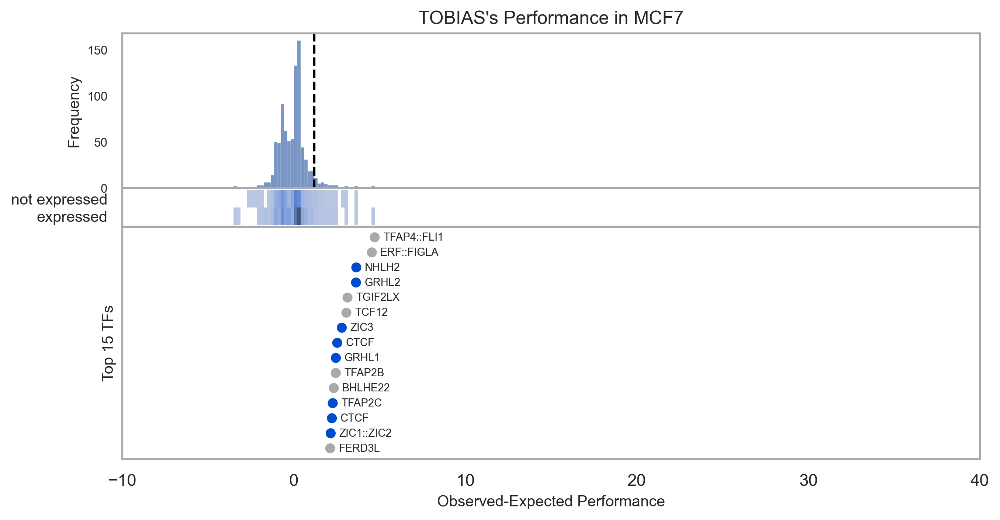

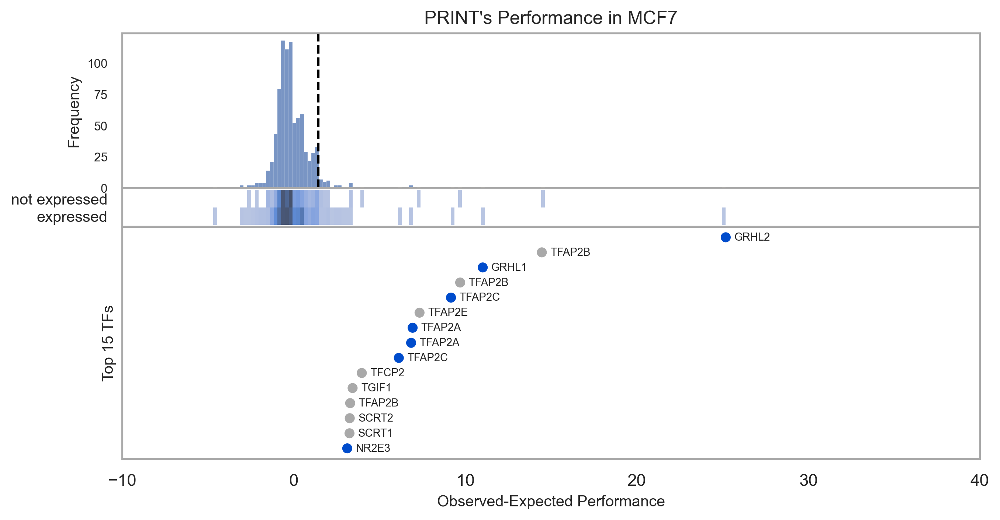

In [802]:
_threetierplot(df[(df.tool == "hint") & (df.cell_line == "MCF7")], xlim=(-10, 40))
_threetierplot(df[(df.tool == "tobias") & (df.cell_line == "MCF7")], xlim=(-10, 40))
_threetierplot(df[(df.tool == "print") & (df.cell_line == "MCF7")], xlim=(-10, 40))

In [803]:
for cl, topN in zip(["HEPG2", "MCF7", "GM12878", "K562", "SKNSH"], [15, 15, 15, 15, 15]):

    toplot = set(df[(df.cell_line==cl) & (df.rank_global<topN)]["name"])
    tohighlight = set(df[(df.cell_line==cl) & (df.rank_global<topN) & (df["CellType_specific_bool"] ==1)]["name"])
    
    cond1 = (df.cell_line==cl)
    cond2 = (df.name.isin(toplot))
    cond3 = (df["CellType_specific_bool"] ==1)
    df_pivot = df[cond1 & cond2].pivot(index="name", columns="tool", values="o-e")
    df_pivot["highlight"] = [1 if i in tohighlight else 0 for i in df_pivot.index]
    print(df_pivot.shape)
    df_pivot.to_csv(f"{cl}_heatmapinput.csv")

(26, 4)
(29, 4)
(30, 4)
(26, 4)
(35, 4)


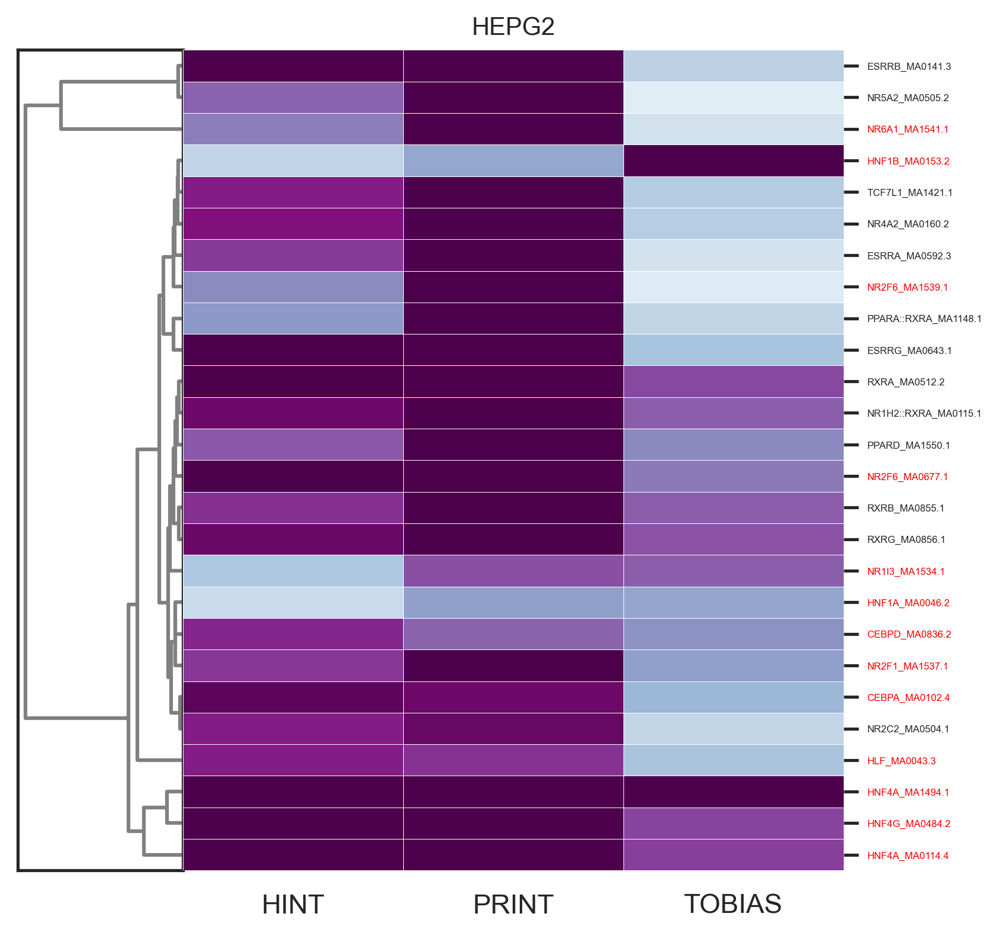

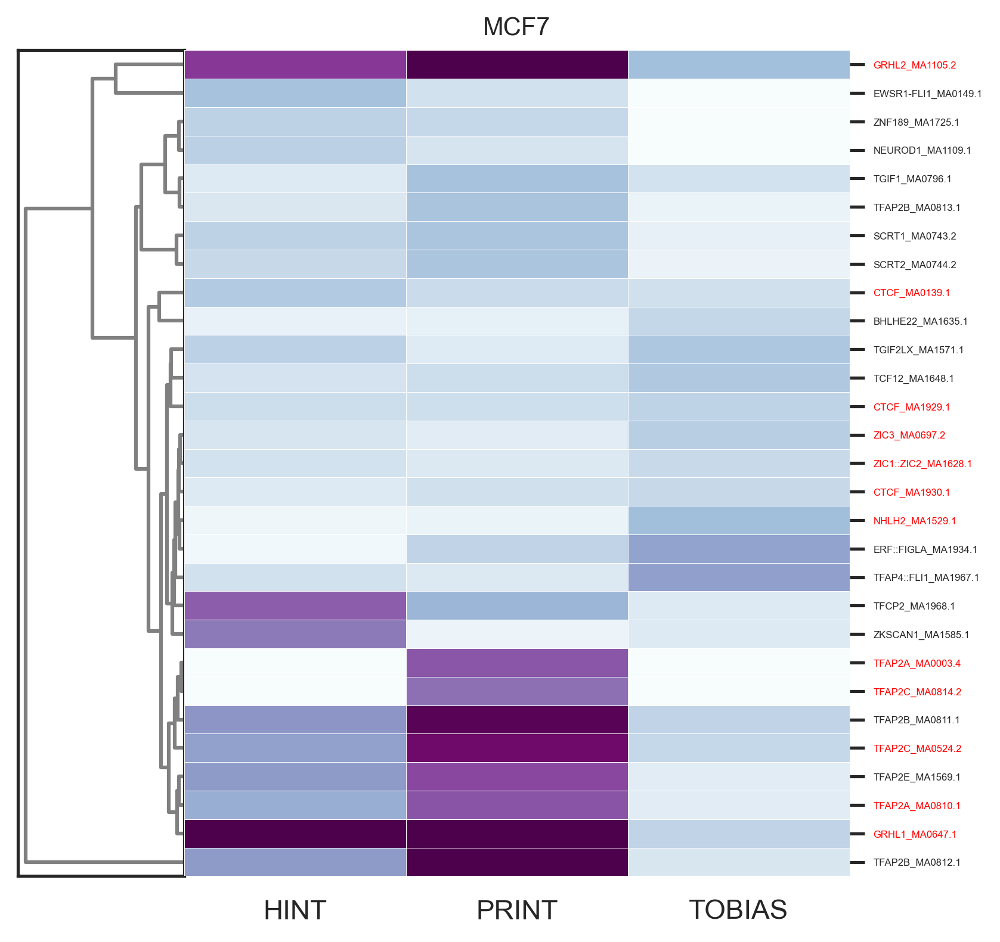

In [804]:
def _plotDendrogram(cl, topN=25):
    toplot = set(df[(df.cell_line==cl) & (df.rank_global<topN)]["name"])
    tohighlight = set(df[(df.cell_line==cl) & (df.rank_global<topN) & (df["CellType_specific_bool"] ==1)]["name"])
    
    df_pivot = df[df.cell_line==cl].pivot(index="name", columns="tool", values="o-e")

    fig = plt.figure(figsize=(6,6))
    gs = GridSpec(1,2, figure=fig, wspace = 0, hspace=0, width_ratios=[1,4])

    #Make dendrogram.
    ax0 = fig.add_subplot(gs[0]) 
    tmp = df_pivot.loc[list(toplot)]
    tmp.columns = [i.upper() for i in tmp.columns]
    linkage = hierarchy.linkage(tmp.loc[list(toplot)], method='average')
    dendrogram = hierarchy.dendrogram(linkage, orientation='left', no_labels=True, 
                                      color_threshold=0, 
                                      above_threshold_color='grey', 
                                      ax=ax0)
    ax0.set_facecolor('white')
    ax0.set_xticks([]); ax0.set_xlabel("")

    reordered_indices = dendrogram['leaves']
    tmp_reorder = tmp.reindex(tmp.index[reordered_indices])

    #Plot heatmap of reordered cells. 
    ax1 = fig.add_subplot(gs[1])
    hm = sns.heatmap(tmp_reorder, 
                yticklabels=True, 
                ax=ax1, 
                cmap='BuPu', 
                #cbar_kws={'label': 'Observed-Expected Performance', 'shrink': .5}, 
                cbar=False,
                linewidth=0.2,
                vmin=0, vmax=10)
    ax1.yaxis.tick_right()  
    ax1.yaxis.set_label_position("right")  
    ax1.yaxis.set_tick_params(labelsize=4, right=True, labelright=True, labelrotation=0) 

    yticks = ax1.get_yticklabels()
    for label in yticks:
        text = label.get_text()
        if text in tohighlight:
            label.set_color("red")                

    ax1.set_title(cl, fontsize=10)
    ax1.set_ylabel("")
    ax1.set_xlabel("")

    plt.show()
    return

_plotDendrogram(cl = "HEPG2",  topN=15)
_plotDendrogram(cl = "MCF7",  topN=15)
# _plotDendrogram(cl = "SKNSH",  topN=10)

## 6.2 upset plots <a class="anchor" id="sixth2-bullet"></a>

In [805]:
from upsetplot import UpSet
from upsetplot import from_contents
from itertools import chain

In [884]:
len(tf_dict["TOBIAS"])

43

HEPG2


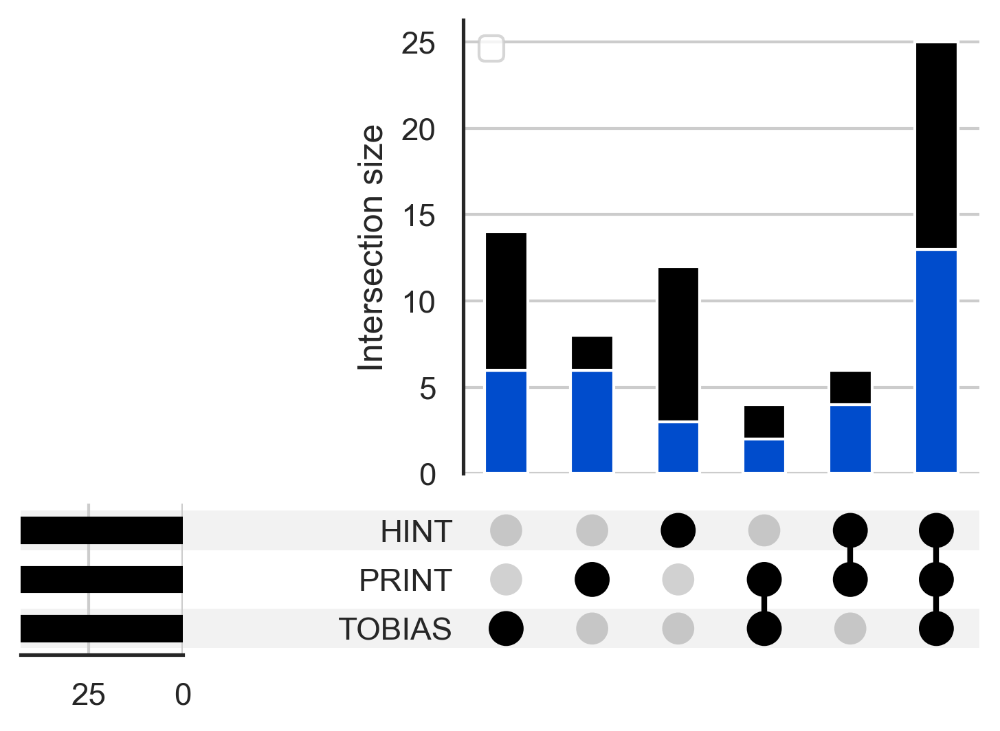

GM12878


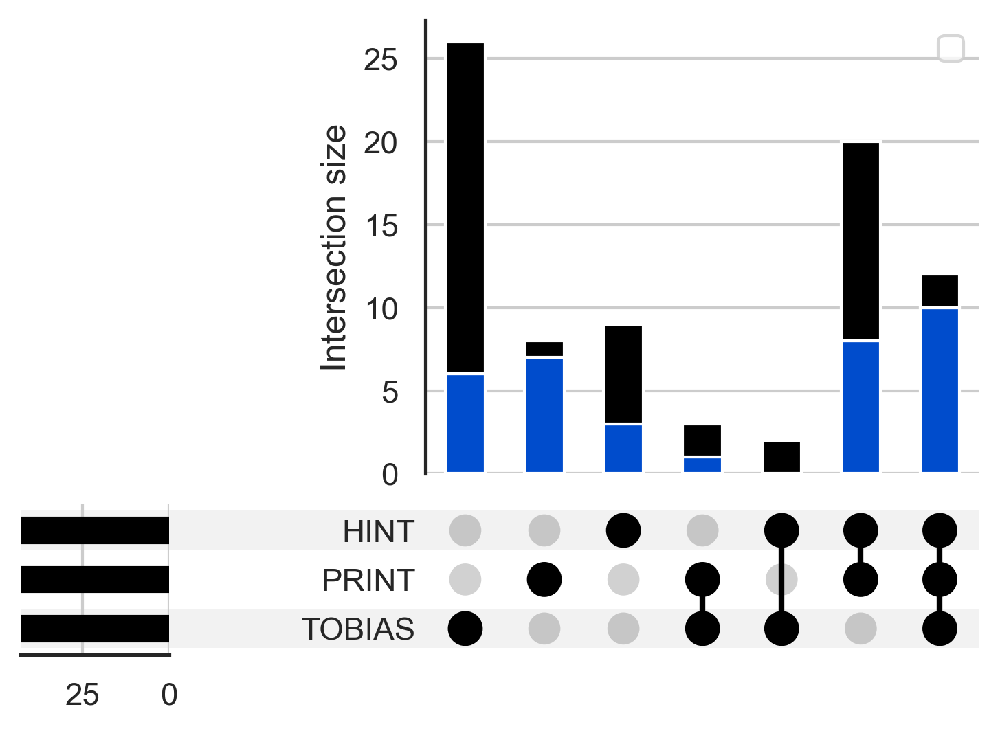

K562


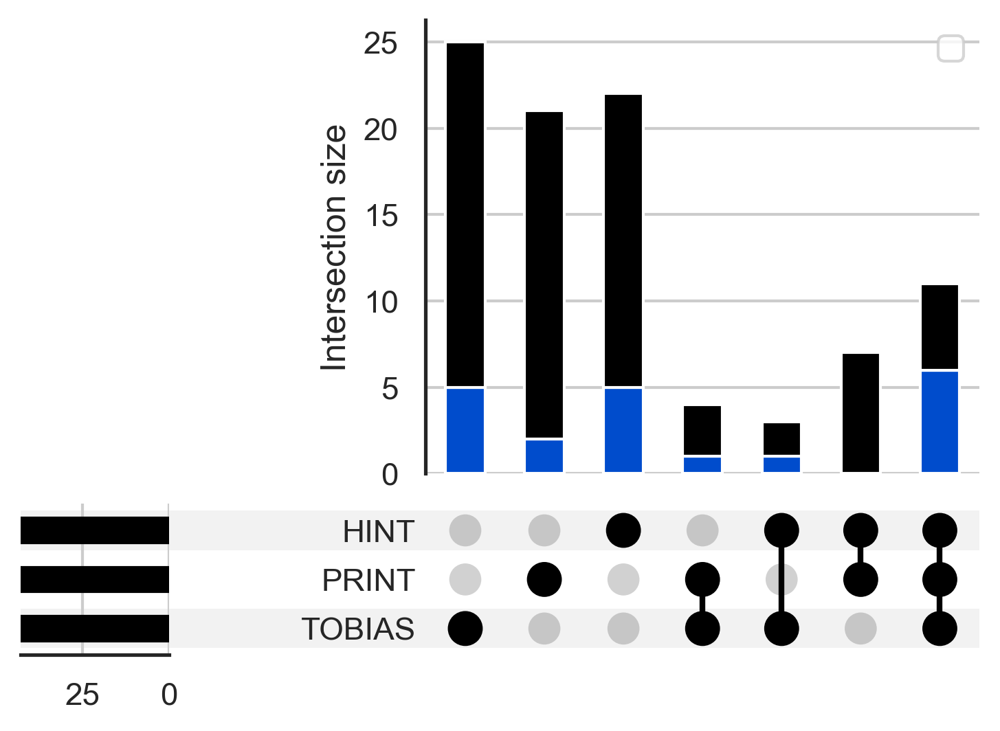

SKNSH


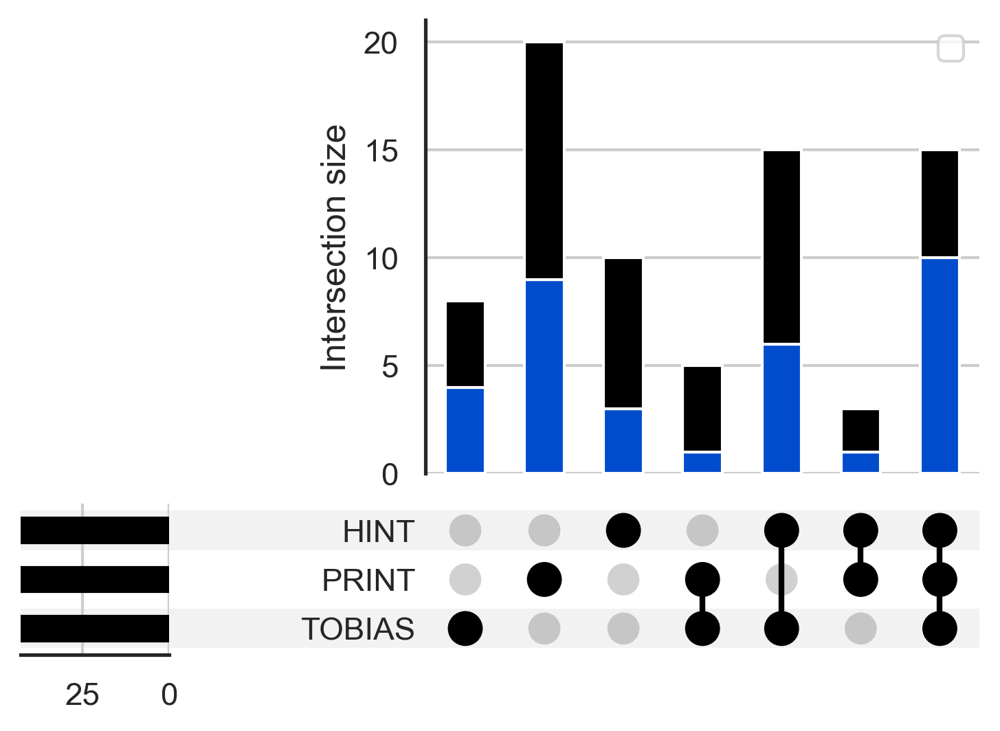

MCF7


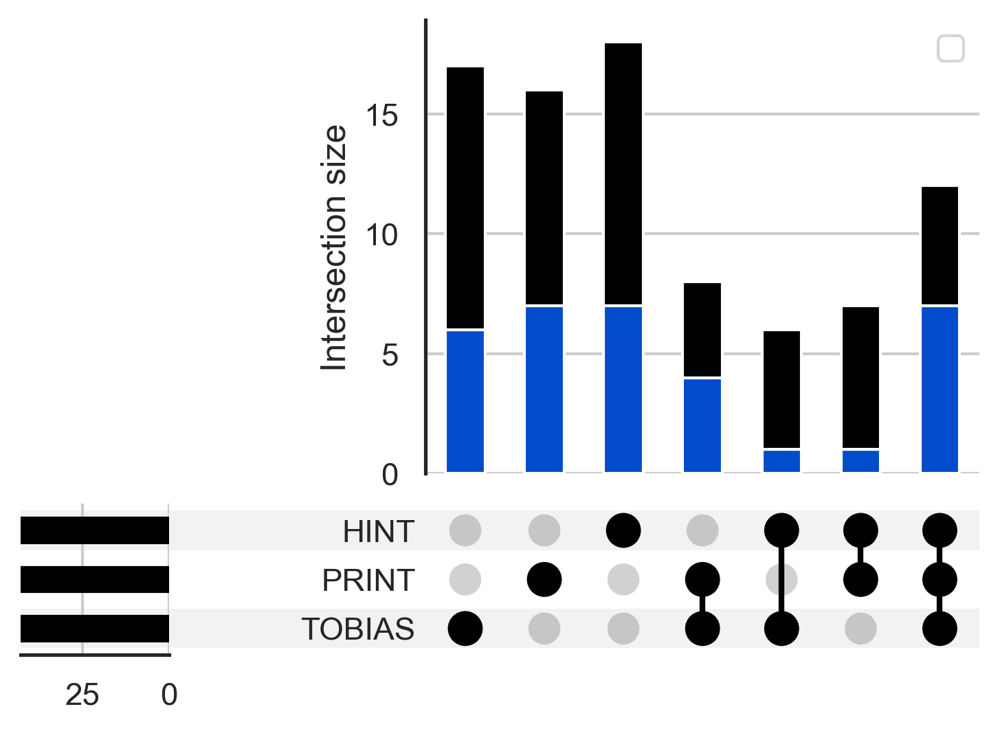

In [806]:
for cl in ["HEPG2", "GM12878", "K562", "SKNSH", "MCF7"]:
    print(cl)
    tf_dict = {}
    
    for i in ["tobias", "print","hint"]:
        tmp = df[(df.cell_line==cl) & (df.tool==i)].copy()
        highlim = np.quantile(tmp["o-e"], 0.95)
        tmp = tmp[(tmp["o-e"] >= highlim)]
        tf_dict[i.upper()] = set(tmp["name"].values)
    
    toplot = from_contents(tf_dict)
    knownTFs = np.unique(df[(df.cell_line==cl) & (df["o-e_RNA"] > 0.5)]["name"])
    toplot["known_TF"] = [1 if i in knownTFs else 0 for i in toplot["id"]]
    
    fig = plt.figure() 
    upset = UpSet(toplot, intersection_plot_elements=0)
    upset.add_stacked_bars(
        by="known_TF", colors=["black", "#004CCC"], title="Intersection size", elements=8
    )
    
    upset.plot(fig=fig)
    #fig.set_size_inches(10, 4)
    fig.set_size_inches(6, 4)
    plt.legend([])
    plt.savefig(f"../12_manuscript_figures/svg/FigS5_upset_{cl}.svg")
    plt.show()

#display(toplot)

## 6.3 kendall-tau ranking <a class="anchor" id="sixth3-bullet"></a>

In [807]:
##WHAT ABOUT MOTIF ENRICHMENT

def _formatEnrichment(value_column = '# of Target Sequences with Motif'):
    allcolnames = ['Motif Name', 'Consensus', 'P-value', 'Log P-value',
                   'q-value (Benjamini)', '# of Target Sequences with Motif',
                   '% of Target Sequences with Motif',
                   '# of Background Sequences with Motif',
                   '% of Background Sequences with Motif', 
                   "NumForegroundSeq", "NumBackgroundSeq"]
    
    df_list = list()
    for cl in ["HEPG2", "MCF7", "K562", "SKNSH", "GM12878"]:
        df = pd.read_table(f"../09_simPWMs/03_enrichment/{cl}/gc_corrected/jaspar/knownResults.txt")
        
        match = re.search(r"\(of (\d+)\)", df.columns[5])
        df["NumForegroundSeq"] = int(match.group(1))
        
        match = re.search(r"\(of (\d+)\)", df.columns[7])
        df["NumBackgroundSeq"] = int(match.group(1))
        
        df.columns = allcolnames
        df["cell_line"] = cl    
        df_list.append(df)
    
        
    df = pd.concat(df_list)
    df['% of Target Sequences with Motif'] = [i[:-1] for i in df['% of Target Sequences with Motif']]
    df['% of Background Sequences with Motif'] = [i[:-1] for i in df['% of Background Sequences with Motif']]
    
    num_cols = ['P-value', 'Log P-value',
           'q-value (Benjamini)', '# of Target Sequences with Motif',
           '% of Target Sequences with Motif',
           '# of Background Sequences with Motif',
           '% of Background Sequences with Motif', 'NumForegroundSeq',
           'NumBackgroundSeq']
    
    df[num_cols] = df[num_cols].apply(pd.to_numeric)
    
    df[['motif', 'TF']] = df["Motif Name"].str.split(':::', expand=True)
    df['motif'] = df['motif'].str.upper()
    df['TF'] = df['TF'].str.upper()
    df["motif_name"] = df["TF"] + "_" + df["motif"]
    df["tool"] = "homer"
    
    if value_column == 'Log P-value':
        df["value"] = 1 - df['Log P-value']
        value_column = "value"
        
    tmp = df[["motif_name", "cell_line", "tool",  value_column]].copy()
    tmp.columns = ["motif", "cell_line", "tool",  "value"]
    return tmp

#'# of Target Sequences with Motif'  low=bad so ascending = False
#'P-value'  low=good so ascending = True
# why you added a 1- flag in the code above.

In [808]:
pt1 = df[["name", "cell_line", "tool", "o-e"]].copy()
pt1.columns = ["motif", "cell_line", "tool", "value"]

pt2 = _formatEnrichment(value_column = 'Log P-value')

# display(pt2.sort_values("value", ascending=False)) #right
# display(pt1.sort_values("value", ascending=False)) #right

final_df = pd.concat([pt1, pt2], axis=0)

#create random shuffle of value
final_df['value_shuffled'] = (
    final_df.groupby(["tool", "cell_line"])['value']
      .transform(lambda x: np.random.permutation(x.values))
)

final_df.index = final_df.motif
display(final_df)

,motif,cell_line,tool,value,value_shuffled
motif,,,,,
AHR::ARNT_MA0006.1,AHR::ARNT_MA0006.1,GM12878,hint,0.055570,1.045748
ALX1_MA0854.1,ALX1_MA0854.1,GM12878,hint,1.230292,-1.642022
ALX3_MA0634.1,ALX3_MA0634.1,GM12878,hint,1.109726,4.270697
ALX4_MA0853.1,ALX4_MA0853.1,GM12878,hint,0.862040,-1.094872
ARGFX_MA1463.1,ARGFX_MA1463.1,GM12878,hint,1.341674,0.429670
...,...,...,...,...,...
NFATC1_MA0624.2,NFATC1_MA0624.2,GM12878,homer,1.000000,14.350000
NFATC3_MA0625.2,NFATC3_MA0625.2,GM12878,homer,1.000000,1.433300
HOXA13_MA0650.3,HOXA13_MA0650.3,GM12878,homer,1.000000,11.930000


In [809]:
from itertools import combinations, product

def _KT_AcrossTools(df, 
                    cell_lines = ["HEPG2", "MCF7", "K562", "SKNSH", "GM12878"], 
                    tools = ["pwm", "hint","tobias", "print"], 
                    rankby="#footprints"):
    
    from scipy.stats import kendalltau, weightedtau
    
    results=list()
    for cl in cell_lines:
        for t1, t2 in list(combinations(tools, 2)):
            sorted_motifs_list1=df.loc[(df.cell_line == cl) & (df.tool==t1)].sort_values(by=rankby, ascending=False).index
            sorted_motifs_list2=df.loc[(df.cell_line == cl) & (df.tool==t2)].sort_values(by=rankby, ascending=False).index
            
            rank_map = {char: rank for rank, char in enumerate(sorted_motifs_list1)}
            ranked_motifs_list1 = [rank_map[char] for char in sorted_motifs_list1]
            ranked_motifs_list2 = [rank_map[char] for char in sorted_motifs_list2]

            kt_cor, pval = kendalltau(ranked_motifs_list1, ranked_motifs_list2) #identical to weightedtau(ranked_list1, ranked_list2, weigher=lambda x: 1)
            wkt_cor = weightedtau(ranked_motifs_list1, ranked_motifs_list2)
            results.append([cl, t1, t2, kt_cor, wkt_cor.statistic])

    tau_df = pd.DataFrame(results, columns = ['CellLine', 'tool1', 'tool2', 'kendall_tau', 'kendall_tau_weighted']) 
    tau_df["tools"] = tau_df["tool1"] + ":" + tau_df["tool2"]
    return tau_df


tmp1 = _KT_AcrossTools(final_df, 
                       tools = ["hint","tobias", "print", "homer"],
                       rankby="value")
tmp1["comparison"] = "Metric"

tmp2 = _KT_AcrossTools(final_df, 
                       tools = ["hint", "tobias", "print", "homer"],
                       rankby="value_shuffled")
tmp2["comparison"] = "Metric: Shuffled"

tau_df = pd.concat([tmp1, tmp2])
tau_df

,CellLine,tool1,tool2,kendall_tau,kendall_tau_weighted,tools,comparison
0,HEPG2,hint,tobias,0.374379,0.331530,hint:tobias,Metric
1,HEPG2,hint,print,0.604020,0.558577,hint:print,Metric
2,HEPG2,hint,homer,0.273190,0.370414,hint:homer,Metric
3,HEPG2,tobias,print,0.314846,0.437787,tobias:print,Metric
4,HEPG2,tobias,homer,0.353621,0.359481,tobias:homer,Metric
5,HEPG2,print,homer,0.294898,0.494290,print:homer,Metric
6,MCF7,hint,tobias,0.229925,0.319460,hint:tobias,Metric
7,MCF7,hint,print,0.487787,0.367591,hint:print,Metric
8,MCF7,hint,homer,0.389089,0.490263,hint:homer,Metric
9,MCF7,tobias,print,0.250433,0.346731,tobias:print,Metric


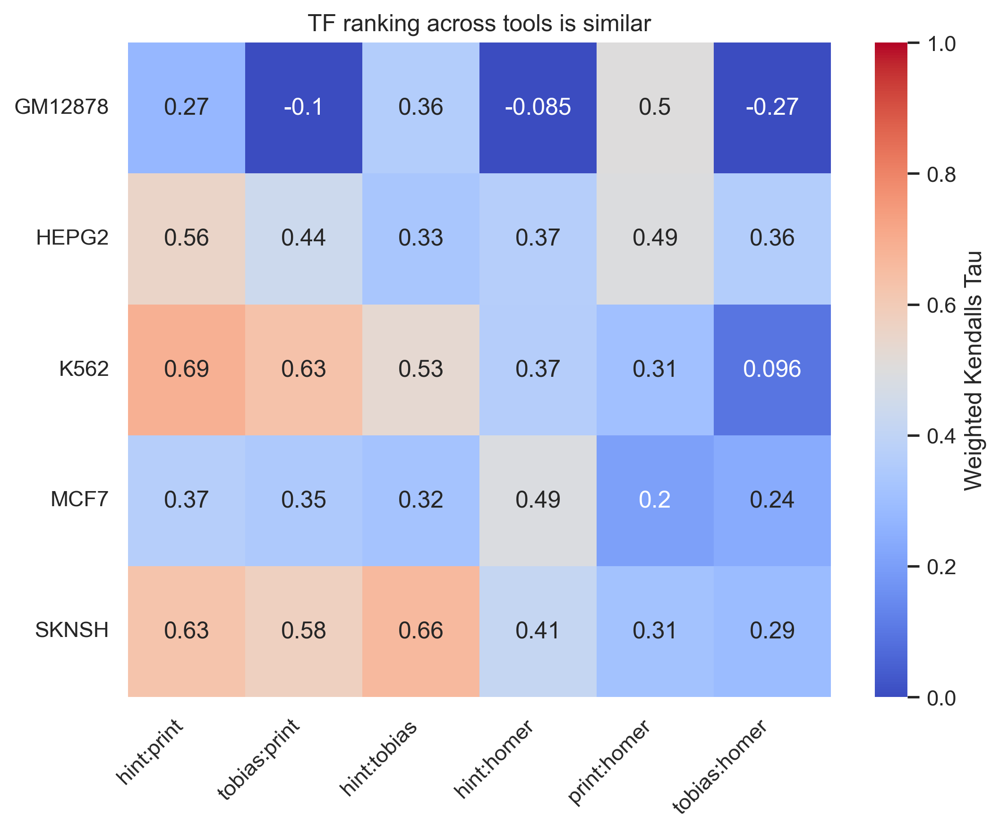

In [810]:
toplot = tau_df[tau_df.comparison == "Metric"].pivot(index='CellLine', columns='tools', values='kendall_tau_weighted')
ylabel_order = ['hint:print', 'tobias:print', 'hint:tobias', 'hint:homer', 'print:homer', 'tobias:homer']

plt.figure(figsize=(8, 6))
sns.heatmap(toplot[ylabel_order],
            annot=True,
            vmin=0, vmax=1,
            cmap="coolwarm", cbar_kws={"label": "Weighted Kendalls Tau"})
plt.ylabel(""); plt.xlabel("")
plt.xticks(rotation=45, ha='right'); plt.yticks(rotation=0) 
plt.title("TF ranking across tools is similar")
plt.show()

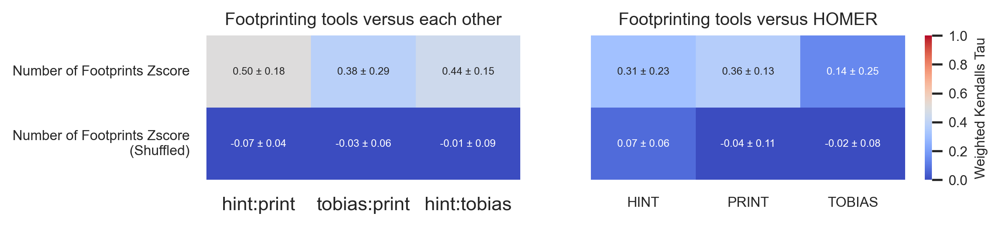

In [811]:
tau_df_grouped = pd.DataFrame({'mean' : tau_df.groupby(["tools", "comparison"])['kendall_tau_weighted'].mean(),
                               'sd'   : tau_df.groupby(["tools", "comparison"])['kendall_tau_weighted'].std()}).reset_index()
tau_df_grouped["labels"] = tau_df_grouped.apply(lambda row: f"{row['mean']:.2f} ± {row['sd']:.2f}", axis=1)

toplot = tau_df_grouped.pivot(index='comparison', columns='tools', values='mean')
labels = tau_df_grouped.pivot(index='comparison', columns='tools', values='labels')

fig, axes = plt.subplots(1, 2, figsize=(8, 1.5), width_ratios=(4,5))  

vals = ['hint:print', 'tobias:print', 'hint:tobias']
sns.heatmap(toplot[vals],
            annot = labels[vals], annot_kws={"size": 6}, fmt='',
            ax=axes[0], 
            cbar=False, cmap="coolwarm",
            vmin=0, vmax=1)

vals = ['hint:homer', 'print:homer', 'tobias:homer']
g = sns.heatmap(toplot[vals], 
            annot = labels[vals], annot_kws={"size": 6}, fmt='',
            ax=axes[1], 
            cbar=True, cmap="coolwarm",
            vmin=0, vmax=1)

axes[0].set_title('Footprinting tools versus each other', fontsize=10)
axes[1].set_title('Footprinting tools versus HOMER', fontsize=10)
#axes[0].set_xticklabels(['HINT vs PRINT', 'PRINT vs TOBIAS', 'HINT vs TOBIAS'], fontsize=8)
axes[1].set_xticklabels(['HINT', 'PRINT', 'TOBIAS'], rotation=0, fontsize=8)
axes[0].set_ylabel(""); axes[0].set_xlabel("")
axes[1].set_ylabel(""); axes[1].set_xlabel("")

axes[0].set_yticklabels(["Number of Footprints Zscore", "Number of Footprints Zscore\n(Shuffled)"], rotation=0, fontsize=8)
axes[1].set_yticklabels("")

colorbar = g.collections[0].colorbar
colorbar.ax.tick_params(labelsize=8)
colorbar.ax.set_ylabel(ylabel = "Weighted Kendalls Tau", fontsize=8)

# plt.tight_layout()
# # plt.savefig("../12_manuscript_figures/svg/Fig3_kendallTau.svg")
# # plt.savefig("../12_manuscript_figures/png/Fig3_kendallTau.png")
# # plt.savefig("../12_manuscript_figures/pdf/Fig3_kendallTau.pdf", bbox_inches='tight')

plt.show()

## 6.4 scatter plots <a class="anchor" id="sixth3-bullet"></a>

## 6.5 heatmaps <a class="anchor" id="sixth4-bullet"></a>

# 7. What about matched data-qualities? 

In [812]:
to_test = ["c1000", "c2500", "c5000", "c7500", "c10000", "c20000"]
to_test + ["baseline"]

['c1000', 'c2500', 'c5000', 'c7500', 'c10000', 'c20000', 'baseline']

In [860]:
to_test = ["c1000", "c2500", "c5000", "c7500", "c10000", "c20000"]
cell_lines = ["HEPG2", "GM12878", "MCF7", "K562", "SKNSH"]
tp_records = []

def _get_first_file(data_dir, prefix):
    for f in os.listdir(data_dir):
       if f.startswith(prefix):
           return f"{data_dir}/{f}"

           
for prog in ["hint", "tobias", "print"]:
    if prog == "hint":
        data_dir = f"../06_dataquality/hint/metrics/no_threshold/"
    elif prog == "tobias":
        data_dir = f"../06_dataquality/tobias/metrics/bound_threshold/"
    elif prog == "print":
        data_dir = f"../06_dataquality/print/metrics/thresh_03/"

    for cl in cell_lines:
        all_prefixes = [f"{cl}_{i}_" for i in to_test] + [f"{cl}_"]
        
        for prefix, cond in zip(all_prefixes, to_test+["baseline"]): 
            inputfile = _get_first_file(data_dir, prefix)
            df = pd.read_csv(inputfile, index_col=0)
            df = df.loc[df["type"] == "tf"]
            df = df.sort_index(ascending=True)
    
            #TP are just the number of footprints in this cell line. 
            ztp = zscore(df["TP"])  # 1D array

            
            for tf, val in zip(df.index, ztp):
                tp_records.append({
                    "prog": prog,
                    "cell_line": cl,
                    "condition": cond,
                    "TF": tf,
                    "zTP": val
                })

long_df = pd.DataFrame(tp_records)
display(long_df)

,prog,cell_line,condition,TF,zTP
0,hint,HEPG2,c1000,AHR::ARNT_MA0006.1,0.166001
1,hint,HEPG2,c1000,ALX1_MA0854.1,-0.772376
2,hint,HEPG2,c1000,ALX3_MA0634.1,-0.640838
3,hint,HEPG2,c1000,ALX4_MA0853.1,-0.797752
4,hint,HEPG2,c1000,ARGFX_MA1463.1,-0.630998
...,...,...,...,...,...
88300,print,SKNSH,baseline,ZNF8_MA1718.1,-0.514821
88301,print,SKNSH,baseline,ZNF93_MA1721.1,1.849444
88302,print,SKNSH,baseline,ZSCAN29_MA1602.1,-0.482073
88303,print,SKNSH,baseline,ZSCAN31_MA1722.1,-0.394103


In [861]:
## BUILD OBSERVED-EXPECTED DF FOR FOOTPRINTING
res_list = []
for info, subset in long_df.groupby(["prog", "condition"]):
    tmp = _build_obs_exp_df(df = subset, val_column = "zTP")
    tmp["tool"] = info[0]
    tmp["condition"] = info[1]
    res_list.append(tmp)
df_FT = pd.concat(res_list)
df_FT[["TF", "motif"]] = df_FT["name"].str.rsplit("_", n=1, expand=True)
display(df_FT)

# ## BUILD OBSERVED-EXPECTED DF FOR RNASEQ
rnaseq = "../09_simPWMs/ENCODE_bulkRNA/MeanExp.csv"
rnaseq_df = pd.read_csv(rnaseq, sep=",")
rnaseq_df = rnaseq_df.melt(var_name='cell_line', id_vars="GeneSymbol", value_name='expression')
rnaseq_df.rename(columns={'GeneSymbol': 'TF'}, inplace=True)
df_RNA = _build_obs_exp_df(rnaseq_df, "expression")
df_RNA = df_RNA.add_suffix('_RNA')
display(df_RNA)

,name,expected_mean,expected_sd,observed,o-e,cell_line,tool,condition,TF,motif
0,AHR::ARNT_MA0006.1,0.111375,0.146959,0.156227,0.305205,GM12878,hint,baseline,AHR::ARNT,MA0006.1
1,ALX1_MA0854.1,-0.773595,0.069296,-0.716595,0.822565,GM12878,hint,baseline,ALX1,MA0854.1
2,ALX3_MA0634.1,-0.556387,0.099037,-0.444386,1.130904,GM12878,hint,baseline,ALX3,MA0634.1
3,ALX4_MA0853.1,-0.798778,0.078870,-0.750870,0.607420,GM12878,hint,baseline,ALX4,MA0853.1
4,ARGFX_MA1463.1,-0.565280,0.073793,-0.425256,1.897539,GM12878,hint,baseline,ARGFX,MA1463.1
...,...,...,...,...,...,...,...,...,...,...
836,ZNF8_MA1718.1,-0.559222,0.046890,-0.589214,-0.639612,SKNSH,tobias,c7500,ZNF8,MA1718.1
837,ZNF93_MA1721.1,2.172951,0.333746,2.831919,1.974458,SKNSH,tobias,c7500,ZNF93,MA1721.1
838,ZSCAN29_MA1602.1,-0.590678,0.108080,-0.559130,0.291897,SKNSH,tobias,c7500,ZSCAN29,MA1602.1
839,ZSCAN31_MA1722.1,-0.324541,0.025613,-0.280776,1.708661,SKNSH,tobias,c7500,ZSCAN31,MA1722.1


,name_RNA,expected_mean_RNA,expected_sd_RNA,observed_RNA,o-e_RNA,cell_line_RNA
0,A1BG,14.536464,10.147959,6.264500,-0.815136,GM12878
1,A1BG-AS1,5.995776,5.993021,3.110000,-0.481523,GM12878
2,A1CF,5.950604,11.889264,0.008000,-0.499829,GM12878
3,A2M,404.152656,807.823261,0.224500,-0.500020,GM12878
4,A2M-AS1,0.532526,0.493938,0.374000,-0.320943,GM12878
...,...,...,...,...,...,...
37791,ZYG11B,4.589266,1.398078,6.786667,1.571730,SKNSH
37792,ZYX,29.685542,11.337726,233.206667,17.950788,SKNSH
37793,ZYXP1,0.000000,0.000000,0.000000,NaN,SKNSH
37794,ZZEF1,14.139328,8.129952,12.788333,-0.166175,SKNSH


In [862]:
#MERGE THEM
df = df_FT.merge(df_RNA, left_on=["TF", "cell_line"], right_on=["name_RNA", "cell_line_RNA"], how='left')


## FIX THE COMPOSITE MOTIFS
#taking the max of the individual scores. 
composite_motifs = np.unique([i for i in df.TF if "::" in i])
cols_to_replace = ['name_RNA', 'expected_mean_RNA', 'expected_sd_RNA', 'observed_RNA', 'o-e_RNA', "cell_line_RNA"]

for cm in composite_motifs:
    tfs = cm.split("::") # e.g., ['ARNT', 'HIF1A']
    
    for cl, gb in df[(df["TF"].isin(tfs))].groupby("cell_line"):
        top_row = gb.sort_values("o-e_RNA", ascending=False).iloc[0] 
        df.loc[(df.TF == cm) & (df.cell_line == cl), cols_to_replace] = top_row[cols_to_replace].values


## Fix some other odd issues. 
#1. if observed is 0, set to 0 not NaN
df.loc[np.isnan(df["o-e_RNA"]) & (df["observed_RNA"] == 0), "o-e_RNA"] = 0

#2. if sd was 0, recalculate to avoid Inf
mask = df["expected_sd_RNA"] == 0
df.loc[mask, "o-e_RNA"] = df[mask]["observed_RNA"] - df[mask]["expected_mean_RNA"]

#3. Lastly, we're just missing some
print(f'Missing expression values for the following TFs: {np.unique(df[np.isnan(df["o-e_RNA"])]["name"])}')


Missing expression values for the following TFs: ['BACH1_MA1633.2' 'DUX_MA0611.2' 'EWSR1-FLI1_MA0149.1' 'MIX-A_MA0621.1'
 'MSX3_MA0709.1' 'RHOX11_MA0629.1' 'ZFP335_MA2002.1']


In [863]:
df["RNA_expression_bool"] = [1 if i > 1 else 0 for i in df.observed_RNA]
df["RNA_expression_bool"] = df["RNA_expression_bool"].astype('category')
df["RNA_expression_bool"] = df["RNA_expression_bool"].cat.reorder_categories([0,1])

#change to be the top 20% 
df["CellType_specific_bool"] = 0
for info, tmp in df.groupby(["cell_line", "condition"]):
    cl = info[0]
    cond = info[1]
    cl_specific = np.unique(tmp[(tmp["o-e_RNA"] > tmp["o-e_RNA"].quantile(0.8))]["name"])
    df.loc[(df.cell_line == cl) & (df.name.isin(cl_specific)) & (df.condition == cond), "CellType_specific_bool"] = 1

print(df["CellType_specific_bool"].value_counts())
# df["CellType_specific_bool"] = [1 if i > 0.5 else 0 for i in df["o-e_RNA"]]
df["CellType_specific_bool"] = df["CellType_specific_bool"].astype('category')
df["CellType_specific_bool"] = df["CellType_specific_bool"].cat.reorder_categories([0,1])

df["rank_global"] = df.groupby(["cell_line", "tool", "condition"])["o-e"].rank(ascending=False)

display(df)

CellType_specific_bool
0    70833
1    17472
Name: count, dtype: int64


,name,expected_mean,expected_sd,observed,o-e,cell_line,tool,condition,TF,motif,name_RNA,expected_mean_RNA,expected_sd_RNA,observed_RNA,o-e_RNA,cell_line_RNA,RNA_expression_bool,CellType_specific_bool,rank_global
0,AHR::ARNT_MA0006.1,0.111375,0.146959,0.156227,0.305205,GM12878,hint,baseline,AHR::ARNT,MA0006.1,ARNT,19.431786,7.471087,13.868500,-0.744642,GM12878,1,0,332.0
1,ALX1_MA0854.1,-0.773595,0.069296,-0.716595,0.822565,GM12878,hint,baseline,ALX1,MA0854.1,ALX1,0.391786,0.458593,0.009500,-0.833607,GM12878,0,0,234.0
2,ALX3_MA0634.1,-0.556387,0.099037,-0.444386,1.130904,GM12878,hint,baseline,ALX3,MA0634.1,ALX3,0.029245,0.055005,0.001500,-0.504405,GM12878,0,0,194.0
3,ALX4_MA0853.1,-0.798778,0.078870,-0.750870,0.607420,GM12878,hint,baseline,ALX4,MA0853.1,ALX4,0.079219,0.114657,0.000500,-0.686557,GM12878,0,0,273.0
4,ARGFX_MA1463.1,-0.565280,0.073793,-0.425256,1.897539,GM12878,hint,baseline,ARGFX,MA1463.1,ARGFX,0.010833,0.013642,0.000000,-0.794101,GM12878,0,0,114.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88300,ZNF8_MA1718.1,-0.559222,0.046890,-0.589214,-0.639612,SKNSH,tobias,c7500,ZNF8,MA1718.1,ZNF8,2.203120,0.648263,3.156667,1.470925,SKNSH,1,0,665.0
88301,ZNF93_MA1721.1,2.172951,0.333746,2.831919,1.974458,SKNSH,tobias,c7500,ZNF93,MA1721.1,ZNF93,4.101047,3.092489,3.938333,-0.052616,SKNSH,1,0,111.0
88302,ZSCAN29_MA1602.1,-0.590678,0.108080,-0.559130,0.291897,SKNSH,tobias,c7500,ZSCAN29,MA1602.1,ZSCAN29,8.698156,1.055445,9.368333,0.634971,SKNSH,1,0,424.0
88303,ZSCAN31_MA1722.1,-0.324541,0.025613,-0.280776,1.708661,SKNSH,tobias,c7500,ZSCAN31,MA1722.1,ZSCAN31,3.164557,1.277886,2.445000,-0.563084,SKNSH,1,0,130.0


In [864]:
top5_dict = {}

for info, subset in df.groupby(["cell_line", "tool", "condition"]):
    highlim = np.quantile(subset["o-e"], 0.95)
    tmp = subset[(subset["o-e"] >= highlim)]["name"].values
    top5_dict[info] = set(tmp)


In [865]:
def jaccard_index(set1, set2):
    intersection = len(set1 & set2)
    union = len(set1 | set2)
    return intersection / union if union else 0.0

def percent(set1, set2):
    intersection = len(set1 & set2)
    return (intersection / len(set1))*100 

external = []
for tool in ["hint", "print", "tobias"]:    
    for cl in ["HEPG2", "GM12878", "MCF7", "K562", "SKNSH"]:
        cond = 'c20000' #"baseline"
        set1 = top5_dict[(cl, tool, cond)]
        external.append({"cell_line": cl,
                             "tool" : tool,
                             "cond": cond,
                             "jaccard": 1,
                             "percent": 100})
        
        #for cond in ['c10000', 'c7500', 'c5000', 'c1000']:
        for cond in ["baseline", 'c10000', 'c7500', 'c5000', 'c1000']:
            set2 = top5_dict[(cl, tool, cond)]
            sim1 = jaccard_index(set1, set2)
            sim2 = percent(set1, set2)

            external.append({"cell_line": cl,
                             "tool" : tool,
                             "cond": cond,
                             "jaccard": sim1,
                             "percent": sim2})

tmp = pd.DataFrame.from_dict(external)
display(tmp)

,cell_line,tool,cond,jaccard,percent
0,HEPG2,hint,c20000,1.000000,100.000000
1,HEPG2,hint,baseline,0.653846,79.069767
2,HEPG2,hint,c10000,0.791667,88.372093
3,HEPG2,hint,c7500,0.686275,81.395349
4,HEPG2,hint,c5000,0.686275,81.395349
...,...,...,...,...,...
85,SKNSH,tobias,baseline,0.869565,93.023256
86,SKNSH,tobias,c10000,0.653846,79.069767
87,SKNSH,tobias,c7500,0.653846,79.069767
88,SKNSH,tobias,c5000,0.622642,76.744186


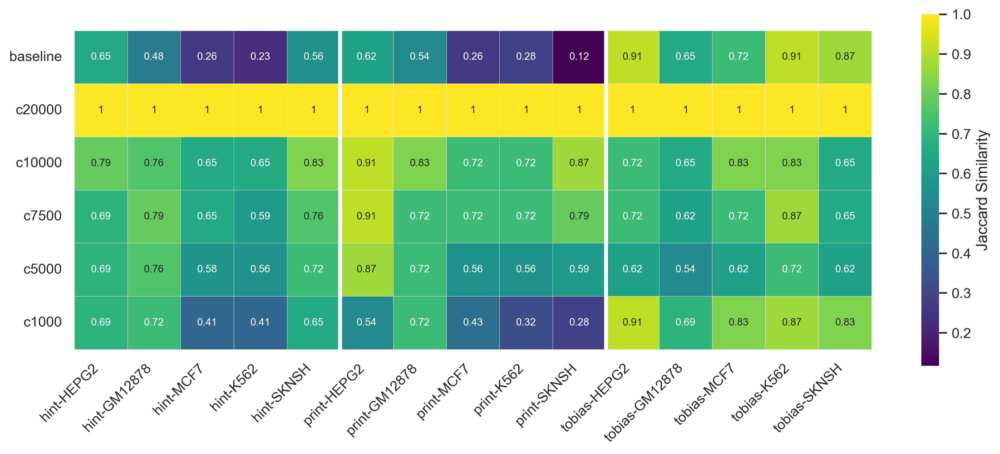

In [866]:
tmp_wide = tmp.pivot(index="cond", columns=["tool", 'cell_line'], values='jaccard')
tmp_wide = tmp_wide.loc[["baseline", 'c20000', 'c10000', 'c7500', 'c5000', 'c1000']]
tmp_wide

plt.figure(figsize=(12, 5))
ax = sns.heatmap(tmp_wide, annot=True, 
                 cmap='viridis', 
                 square=True,
                 annot_kws={"size": 8},
                 cbar_kws={'label': 'Jaccard Similarity'},
                linewidth=0.2)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.ylabel(""); plt.xlabel("")

ax.vlines(x=5, ymin=0, ymax=6, colors="white", linewidth=3)
ax.vlines(x=10, ymin=0, ymax=6, colors="white", linewidth=3)

plt.show()

tool             hint                                                  \
cell_line       HEPG2     GM12878        MCF7        K562       SKNSH   
cond                                                                    
baseline    79.069767   65.116279   41.860465   37.209302   72.093023   
c20000     100.000000  100.000000  100.000000  100.000000  100.000000   
c10000      88.372093   86.046512   79.069767   79.069767   90.697674   
c7500       81.395349   88.372093   79.069767   74.418605   86.046512   
c5000       81.395349   86.046512   76.744186   72.093023   83.720930   
c1000       81.395349   83.720930   58.139535   58.139535   79.069767   

tool            print                                                  \
cell_line       HEPG2     GM12878        MCF7        K562       SKNSH   
cond                                                                    
baseline    76.744186   69.767442   41.860465   44.186047   20.930233   
c20000     100.000000  100.000000  100.000000  100.000000  100.000000   
c10000      95.348837   90.697674   83.720930   83.720930   93.023256   
c7500       95.348837   83.720930   83.720930   83.720930   88.372093   
c5000       93.023256   83.720930   72.093023   72.093023   74.418605   
c1000       69.767442   83.720930   60.465116   48.837209   44.186047   

tool           tobias                                                  
cell_line       HEPG2     GM12878        MCF7        K562       SKNSH  
cond                                                                   
baseline    95.348837   79.069767   83.720930   95.348837   93.023256  
c20000     100.000000  100.000000  100.000000  100.000000  100.000000  
c10000      83.720930   79.069767   90.697674   90.697674   79.069767  
c7500       83.720930   76.744186   83.720930   93.023256   79.069767  
c5000       76.744186   69.767442   76.744186   83.720930   76.744186  
c1000       95.348837   81.395349   90.697674   93.023256   90.697674

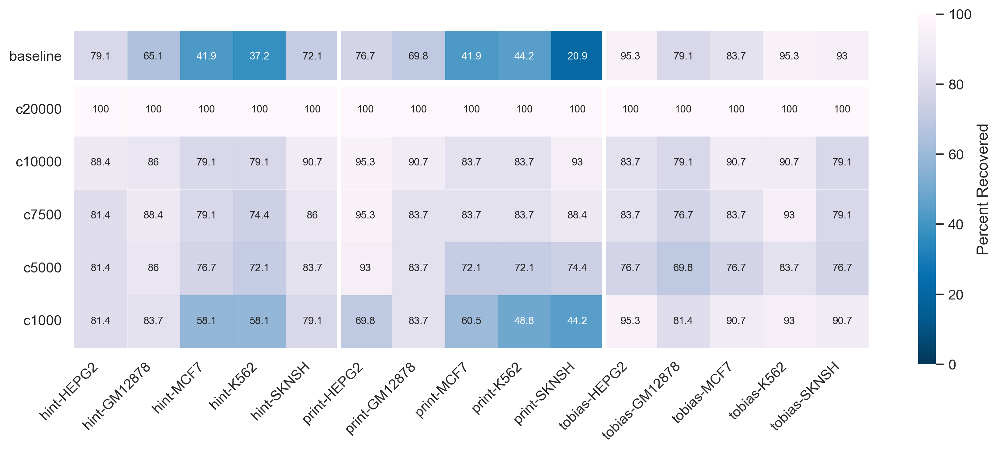

In [867]:
tmp_wide = tmp.pivot(index="cond", columns=["tool", 'cell_line'], values='percent')
tmp_wide = tmp_wide.loc[["baseline", 'c20000', 'c10000', 'c7500', 'c5000', 'c1000']]
display(tmp_wide)

plt.figure(figsize=(12, 5))
ax = sns.heatmap(tmp_wide, annot=True, 
                 cmap='PuBu_r', 
                 square=True,
                 fmt='.3g',
                 vmin=0, vmax=100,
                 annot_kws={"size": 8},
                 cbar_kws={'label': 'Percent Recovered'},
                 linewidth=0.2)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.ylabel(""); plt.xlabel("")

ax.vlines(x=5, ymin=0, ymax=6, colors="white", linewidth=3)
ax.vlines(x=10, ymin=0, ymax=6, colors="white", linewidth=3)
ax.hlines(y=1, xmin=0, xmax=15, colors="white", linewidth=5)

plt.show()

tool                       hint                                      \
cell_line                 HEPG2     GM12878        MCF7        K562   
unmatched: baseline   79.069767   65.116279   41.860465   37.209302   
matched: 20K cells   100.000000  100.000000  100.000000  100.000000   
matched: 10K cells    88.372093   86.046512   79.069767   79.069767   
matched: 5K cells     81.395349   86.046512   76.744186   72.093023   
matched: 1K cells     81.395349   83.720930   58.139535   58.139535   

tool                                  print                          \
cell_line                 SKNSH       HEPG2     GM12878        MCF7   
unmatched: baseline   72.093023   76.744186   69.767442   41.860465   
matched: 20K cells   100.000000  100.000000  100.000000  100.000000   
matched: 10K cells    90.697674   95.348837   90.697674   83.720930   
matched: 5K cells     83.720930   93.023256   83.720930   72.093023   
matched: 1K cells     79.069767   69.767442   83.720930   60.465116   

tool                                             tobias              \
cell_line                  K562       SKNSH       HEPG2     GM12878   
unmatched: baseline   44.186047   20.930233   95.348837   79.069767   
matched: 20K cells   100.000000  100.000000  100.000000  100.000000   
matched: 10K cells    83.720930   93.023256   83.720930   79.069767   
matched: 5K cells     72.093023   74.418605   76.744186   69.767442   
matched: 1K cells     48.837209   44.186047   95.348837   81.395349   

tool                                                     
cell_line                  MCF7        K562       SKNSH  
unmatched: baseline   83.720930   95.348837   93.023256  
matched: 20K cells   100.000000  100.000000  100.000000  
matched: 10K cells    90.697674   90.697674   79.069767  
matched: 5K cells     76.744186   83.720930   76.744186  
matched: 1K cells     90.697674   93.023256   90.697674

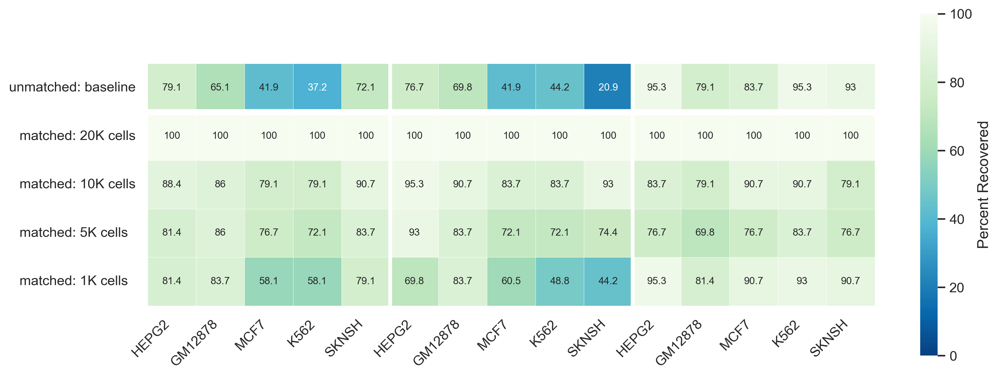

In [881]:

tmp_wide = tmp[tmp.cond != "c7500"].pivot(index="cond", columns=["tool", 'cell_line'], values='percent')
tmp_wide = tmp_wide.loc[["baseline", 'c20000', 'c10000', 'c5000', 'c1000']]
tmp_wide.index = ["unmatched: baseline", "matched: 20K cells", "matched: 10K cells", "matched: 5K cells  ", "matched: 1K cells  "]

display(tmp_wide)

plt.figure(figsize=(12, 5))
ax = sns.heatmap(tmp_wide, annot=True, 
                 cmap='GnBu_r', 
                 square=True,
                 fmt='.3g',
                 vmin=0, vmax=100,
                 annot_kws={"size": 8},
                 cbar_kws={'label': 'Percent Recovered'},
                 linewidth=0.2)
#plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.ylabel(""); plt.xlabel("")
ax.set_xticklabels(labels = ["HEPG2", "GM12878", "MCF7", "K562", "SKNSH"] * 3, rotation=45, ha='right')

ax.vlines(x=5, ymin=0, ymax=6, colors="white", linewidth=3)
ax.vlines(x=10, ymin=0, ymax=6, colors="white", linewidth=3)
ax.hlines(y=1, xmin=0, xmax=15, colors="white", linewidth=5)
plt.savefig(f"../12_manuscript_figures/svg/FigS5_downsampling.svg")

plt.show()
